In [1]:
"""
    Residual Convolutional Neural Network for Cifar10
    
    Implemented by Paweł Kubiak 2017/18
    
    References:
     * [CS231n Convolutional Neural Networks for Visual Recognition](http://cs231n.github.io/convolutional-networks/)
     * [Deep Residual Learning for Image Recognition](https://arxiv.org/abs/1512.03385)
     * [Gentle Introduction to the Adam Optimization Algorithm for Deep Learning](https://machinelearningmastery.com/adam-optimization-algorithm-for-deep-learning/)
"""

from cifar10.cifar10 import Cifar10
import tensorflow as tf
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt #visualize results
%matplotlib inline

In [5]:
# def network(input, reuse, training):
#     with tf.variable_scope('convnet', reuse=reuse):
#         # Conv1 [32,32,3] -> [16,16,32]
#         conv1 = tf.layers.conv2d(input, 32, 5, padding= 'SAME')
#         conv1 = tf.nn.leaky_relu(conv1)
#         conv1 = tf.layers.batch_normalization(conv1, training = training)
#         conv1 = tf.layers.average_pooling2d(conv1, 2, 2, padding = 'SAME')
        
#         # Conv2 [16,16,32] -> [8,8,64]
#         conv2 = tf.layers.conv2d(conv1, 64, 3, padding = 'SAME')
#         conv2 = tf.nn.leaky_relu(conv2)
#         conv2 = tf.layers.batch_normalization(conv2, training = training)
#         conv2 = tf.layers.average_pooling2d(conv2, 2, 2, padding = 'SAME')
        
#         # Conv3 [8,8,64] -> [4,4,128]
#         conv3 = tf.layers.conv2d(conv2, 128, 3, padding = 'SAME')
#         conv3 = tf.nn.leaky_relu(conv3)
#         conv3 = tf.layers.batch_normalization(conv3, training = training)
#         conv3 = tf.layers.average_pooling2d(conv3, 2, 2, padding = 'SAME')
        
#         # Conv4 [4,4,128] -> [2,2,256]
#         conv4 = tf.layers.conv2d(conv3, 256, 3, padding = 'SAME')
#         conv4 = tf.nn.leaky_relu(conv4)
#         conv4 = tf.layers.batch_normalization(conv4, training = training)
#         conv4 = tf.layers.average_pooling2d(conv4, 2, 2, padding = 'SAME')
        
#         # Full1
#         full1 = tf.contrib.layers.flatten(conv3)
#         full1 = tf.layers.dense(full1, 1000)
#         full1 = tf.nn.leaky_relu(full1)
        
#         # Full2
#         full2 = tf.layers.dense(full1, 10)
        
#         return full2

def layer(input, size, training):
    x = tf.layers.batch_normalization(input, training = training)
    x = tf.nn.leaky_relu(x)
    x = tf.layers.conv2d(x, size, 3, padding = 'SAME')
    
    x = tf.layers.batch_normalization(x,  training = training)
    x = tf.nn.leaky_relu(x)
    x = tf.layers.conv2d(x, size, 3, padding = 'SAME')
    
    return x + input

def layer_sub(input, size, training):
    x = tf.layers.batch_normalization(input,  training = training)
    x = tf.nn.leaky_relu(x)
    x = tf.layers.conv2d(x, size, 3, strides=2, padding = 'SAME')
    
    x = tf.layers.batch_normalization(x,  training = training)
    x = tf.nn.leaky_relu(x)
    x = tf.layers.conv2d(x, size, 3, padding = 'SAME')
    
    return x + tf.layers.conv2d(input, size, 3, strides=2, padding = 'SAME')

#     x = tf.layers.conv2d(input, size, 3, strides=2, padding = 'SAME')
#     x = tf.layers.batch_normalization(x)
#     x = tf.nn.leaky_relu(x)

#     x = tf.layers.conv2d(x, size, 3, padding = 'SAME')
#     x = tf.layers.batch_normalization(x)

#     y = tf.layers.conv2d(input, size, 3, strides=2, padding = 'SAME')
#     input = tf.layers.average_pooling2d(input, 2, 2, padding = 'SAME')
#     padding = [[0,0],[0,0],[0,0],[0,size - input.get_shape().as_list()[-1]]]
#     print(padding)
#     input = tf.pad(input, padding, "CONSTANT")
    
#     return tf.nn.leaky_relu(x+y)

# 
def resnet(input, reuse, training, n = 4):
    with tf.variable_scope('resnet', reuse=reuse):
        dropout = tf.layers.dropout(input, 0.3, training= training)

        conv1 = tf.layers.conv2d(input, 16, 3,padding= 'SAME')
        conv1 = tf.layers.batch_normalization(conv1, training = training)
        conv1 = tf.nn.leaky_relu(conv1)

        x = conv1
        for i in range(n):
            x = layer(x, 16, training)
        
        x = layer_sub(x, 32, training)
        for i in range(n-1):
            x = layer(x, 32, training)
            
        x = layer_sub(x, 64, training)
        for i in range(n-1):
            x = layer(x, 64, training)
        
        avg = tf.layers.average_pooling2d(x, 2, 2, padding = 'SAME')
        dropout = tf.layers.dropout(avg, 0.1, training = training)
        
        full1 = tf.contrib.layers.flatten(dropout)
        full1 = tf.layers.dense(full1, 10)
        
        return full1

LABELS = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
def display_images(imgs, labels_pred, labels, width, height):
    imgs = (imgs + 1.0) / 2.0
    fig, axes= plt.subplots(height, width, figsize=(20,10))
    
    for i in range(height):
        for j in range(width):
            data = imgs[i*width+j,:,:,:]

            axes[i, j].imshow(data, cmap=plt.cm.hot)
            if labels_pred[i*width+j] == labels[i*width+j]:
                color = 'black'
            else:
                color = 'red'
            axes[i, j].set_title(LABELS[labels_pred[i*width+j]], color = color)
            axes[i, j].axis("off")
    
    plt.show()

In [6]:
tf.reset_default_graph()

BATCH_SIZE = 512

def random_rotate(image):
    deg = 20.0 * 3.1415926 / 180.0
    rot = tf.random_uniform([1], -deg, deg)
    image = tf.contrib.image.rotate(image, rot, 'BILINEAR')
    image = tf.image.resize_images(tf.image.central_crop(image, 0.80), (32, 32), tf.image.ResizeMethod.BILINEAR)    
    return image

def perturb(image):
    image = (image + 1.0) / 2.0

    rand = tf.random_uniform([1], 0, 7, tf.int32)

    image = tf.case({
        tf.equal(rand[0], 3): (lambda: random_rotate(image)),
        tf.equal(rand[0], 4): (lambda: tf.image.random_saturation(image, lower=0.8, upper=1.2)),
        tf.equal(rand[0], 5): (lambda: tf.image.random_brightness(image, max_delta=32. / 255.)),
        tf.equal(rand[0], 6): (lambda: tf.image.random_contrast(image, lower=0.8, upper=1.2)),
    }, default = (lambda: image))

    image = tf.image.random_flip_left_right(image)

    #image = tf.cond(tf.equal(rand[5], 0), lambda: tf.image.random_hue(image, max_delta=0.05), lambda: image)
    
    image = tf.clip_by_value(image, 0.0, 1.0)
    image = 2.0 * image - 1.0
    
    return image

def batch_perturb(images, labels):
    images = tf.map_fn(perturb, images)
    
    return images, labels

...
# Load train data
x_train, y_train = Cifar10.load_train()

dataset_train = tf.data.Dataset.zip((
    tf.data.Dataset.from_tensor_slices(x_train),
    tf.data.Dataset.from_tensor_slices(y_train)
)).shuffle(buffer_size = y_train.shape[0]).repeat().apply(tf.contrib.data.batch_and_drop_remainder(BATCH_SIZE)).map(batch_perturb)

iterator_train = dataset_train.make_one_shot_iterator()

# Load test data
x_test, y_test = Cifar10.load_test()
dataset_test = tf.data.Dataset.zip((
    tf.data.Dataset.from_tensor_slices(x_test),
    tf.data.Dataset.from_tensor_slices(y_test)
)).shuffle(buffer_size = y_test.shape[0]).repeat().apply(tf.contrib.data.batch_and_drop_remainder(y_test.shape[0]))#.map(batch_perturb)

iterator_test = dataset_test.make_one_shot_iterator()
#######

train_inputs, train_labels = iterator_train.get_next()

train_model = resnet(train_inputs, False, True)

cross_entropy = tf.reduce_mean(
    tf.nn.sparse_softmax_cross_entropy_with_logits(
        logits = train_model,
        labels = train_labels
    )
)


update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)

trainer = tf.train.AdamOptimizer(0.001).minimize(cross_entropy)
# trainer = tf.train.GradientDescentOptimizer(0.005).minimize(cross_entropy)

# Testing
test_inputs, test_labels = iterator_test.get_next()

test_model = resnet(test_inputs, True, False)
prediction = tf.argmax(tf.nn.softmax(test_model), axis = 1)
correct = tf.equal(prediction, test_labels)
accuracy = tf.reduce_mean(tf.cast(correct, tf.float32))

init = tf.global_variables_initializer()

<_RestructuredDataset shapes: ((10000, 32, 32, 3), (10000,)), types: (tf.float32, tf.int64)>
(50000,)


Epoch: 0 acc: 68.1900024414 score: 1.20204254028
airplane: 69.8, automobile: 73.6, bird: 66.0, cat: 49.1, deer: 61.3, dog: 61.7, frog: 69.0, horse: 70.7, ship: 87.8, truck: 72.9


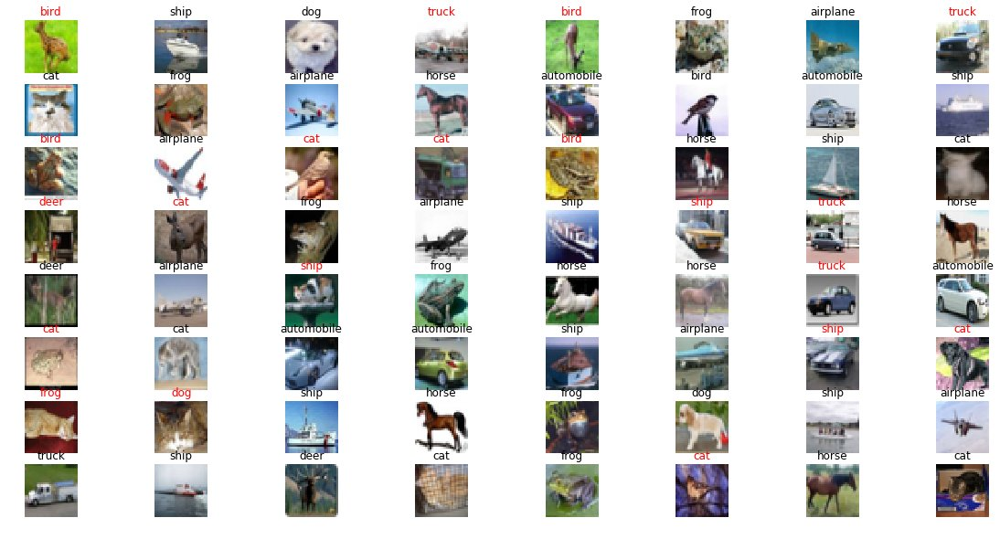

Saving


Epoch: 1 acc: 74.7300028801 score: 0.726128336964
airplane: 84.5, automobile: 84.5, bird: 74.9, cat: 58.5, deer: 67.5, dog: 59.4, frog: 79.7, horse: 77.1, ship: 79.4, truck: 81.8


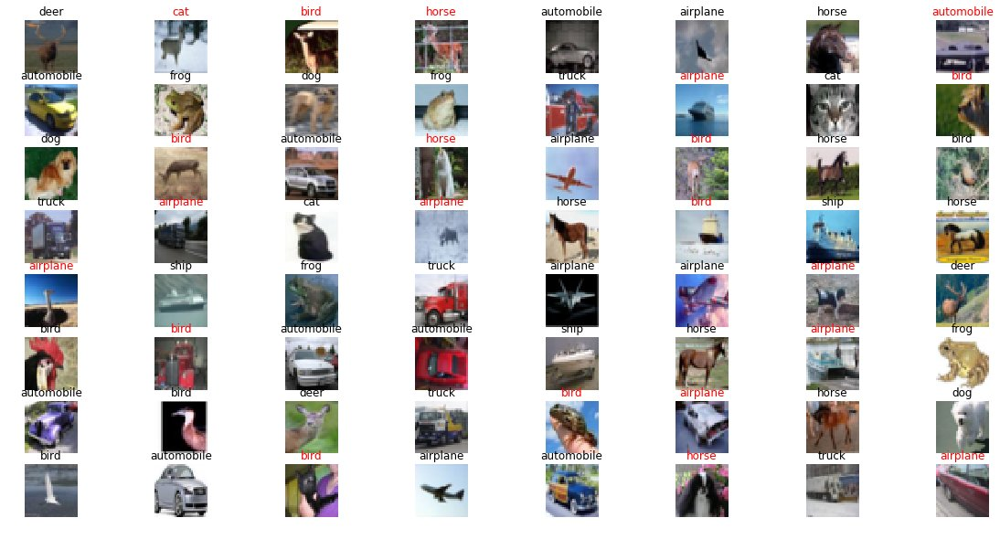

Saving


Epoch: 2 acc: 76.700001955 score: 0.556115987781
airplane: 84.2, automobile: 91.6, bird: 81.6, cat: 62.7, deer: 74.0, dog: 57.5, frog: 76.6, horse: 67.4, ship: 86.0, truck: 85.4


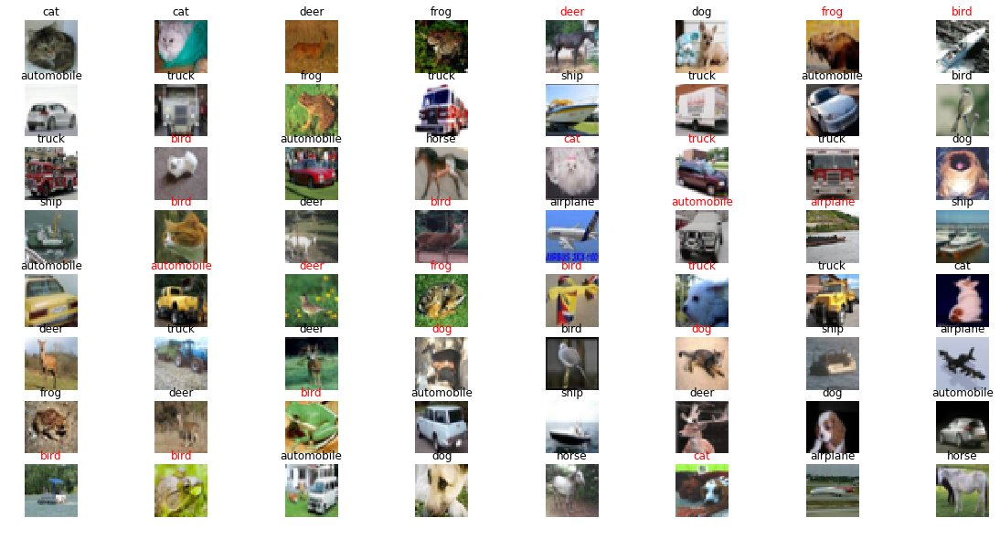

Saving


Epoch: 3 acc: 78.1700015068 score: 0.455308125246
airplane: 82.2, automobile: 86.2, bird: 61.9, cat: 70.3, deer: 78.8, dog: 60.3, frog: 73.8, horse: 87.8, ship: 94.8, truck: 85.6


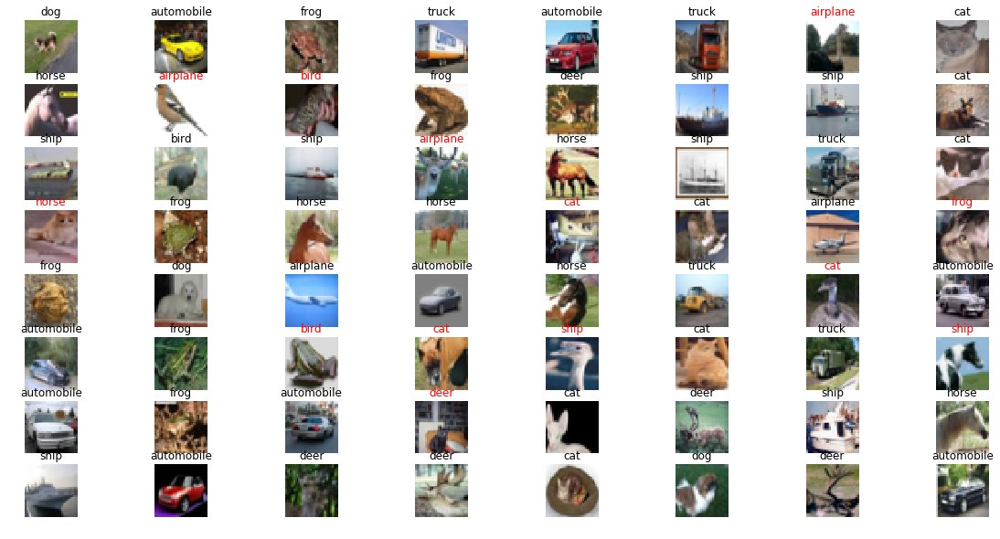

Saving


Epoch: 4 acc: 80.0000011921 score: 0.382066716202
airplane: 83.1, automobile: 90.9, bird: 73.1, cat: 53.9, deer: 83.3, dog: 77.4, frog: 85.0, horse: 78.3, ship: 84.1, truck: 90.9


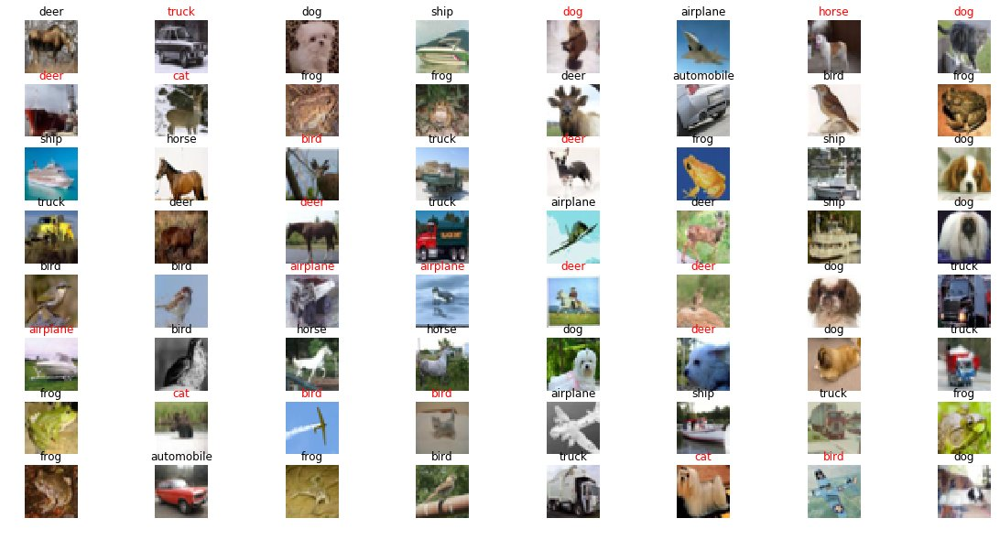

Saving


Epoch: 5 acc: 81.3099980354 score: 0.329175236065
airplane: 83.6, automobile: 92.2, bird: 67.2, cat: 66.4, deer: 88.6, dog: 72.2, frog: 83.5, horse: 84.1, ship: 89.2, truck: 86.1


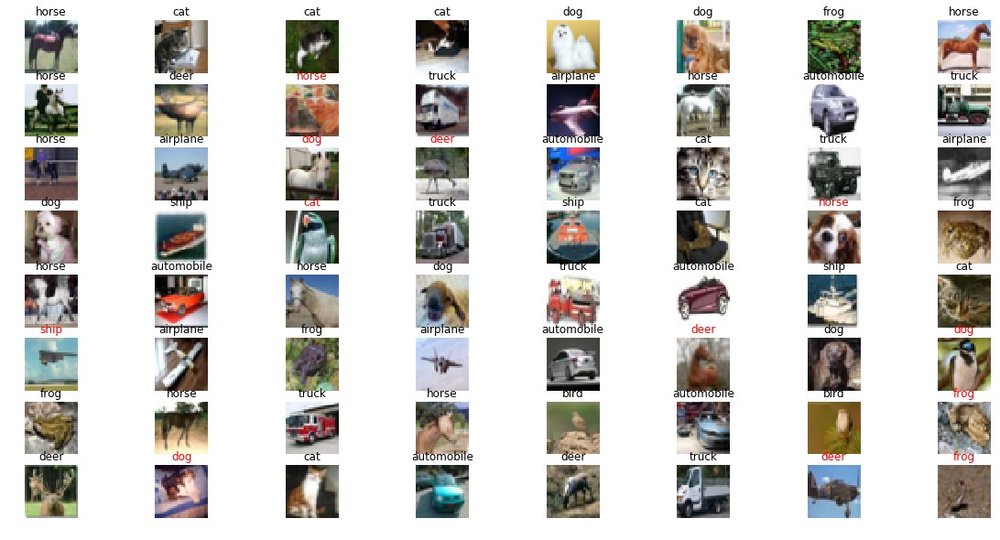

Saving


Epoch: 6 acc: 81.510001421 score: 0.288239581331
airplane: 81.3, automobile: 89.7, bird: 69.5, cat: 70.8, deer: 85.8, dog: 74.0, frog: 82.6, horse: 80.9, ship: 90.8, truck: 89.7


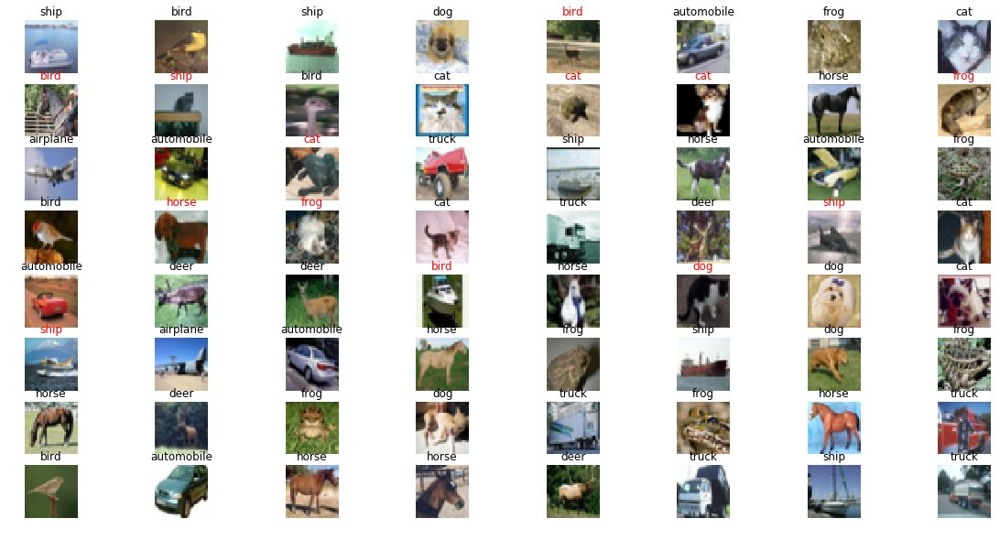

Saving


Epoch: 7 acc: 79.9199998379 score: 0.254987794228
airplane: 87.2, automobile: 94.9, bird: 80.9, cat: 60.7, deer: 68.6, dog: 66.5, frog: 84.7, horse: 78.3, ship: 90.7, truck: 86.7


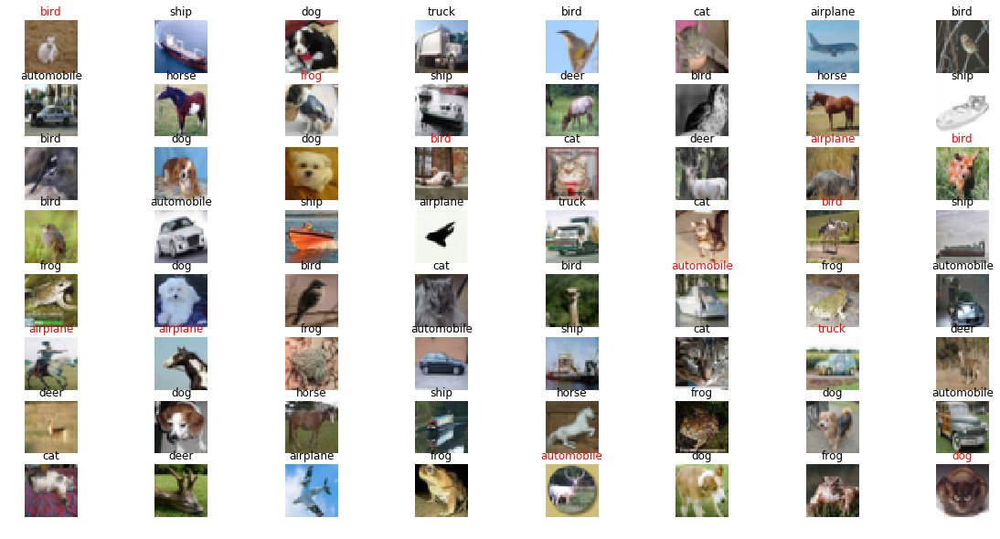

Epoch: 8 acc: 79.8399984837 score: 0.227306770797
airplane: 87.0, automobile: 97.9, bird: 84.0, cat: 53.6, deer: 75.9, dog: 69.7, frog: 81.6, horse: 79.8, ship: 88.8, truck: 80.1


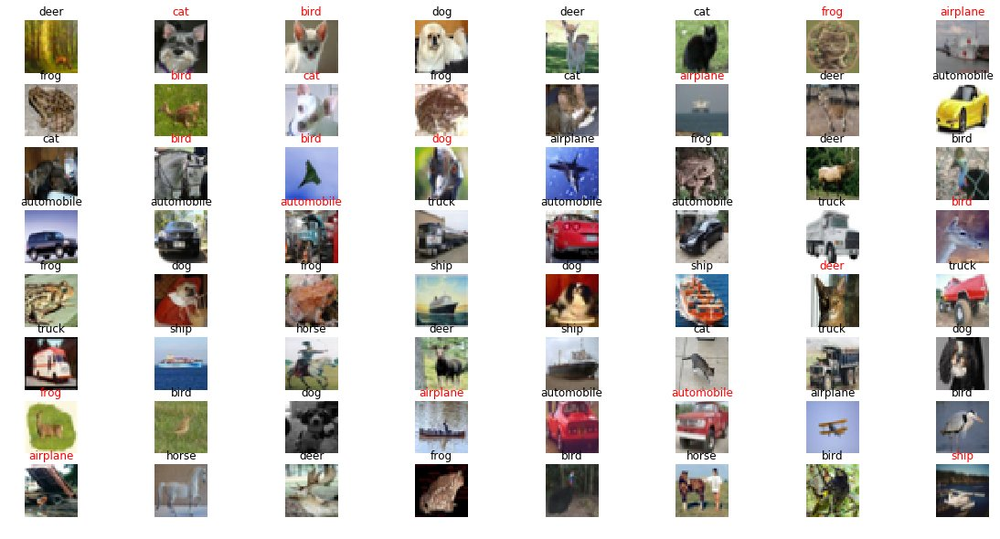

Epoch: 9 acc: 80.4099977016 score: 0.209210668696
airplane: 80.2, automobile: 91.1, bird: 79.4, cat: 78.0, deer: 65.7, dog: 68.9, frog: 87.0, horse: 78.0, ship: 91.1, truck: 84.7


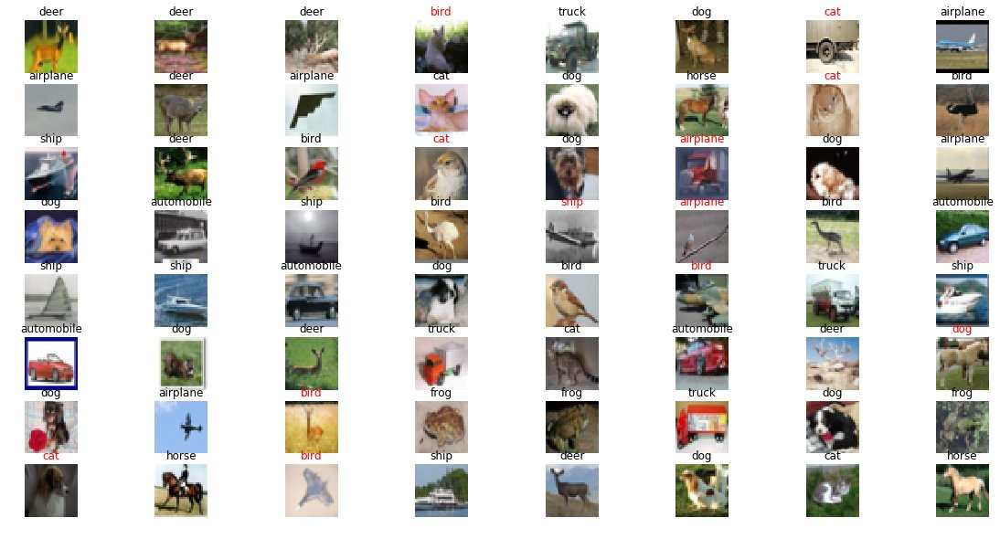

Epoch: 10 acc: 81.0199975967 score: 0.198575934582
airplane: 87.0, automobile: 89.7, bird: 72.9, cat: 63.8, deer: 78.2, dog: 62.9, frog: 83.8, horse: 89.3, ship: 95.4, truck: 87.2


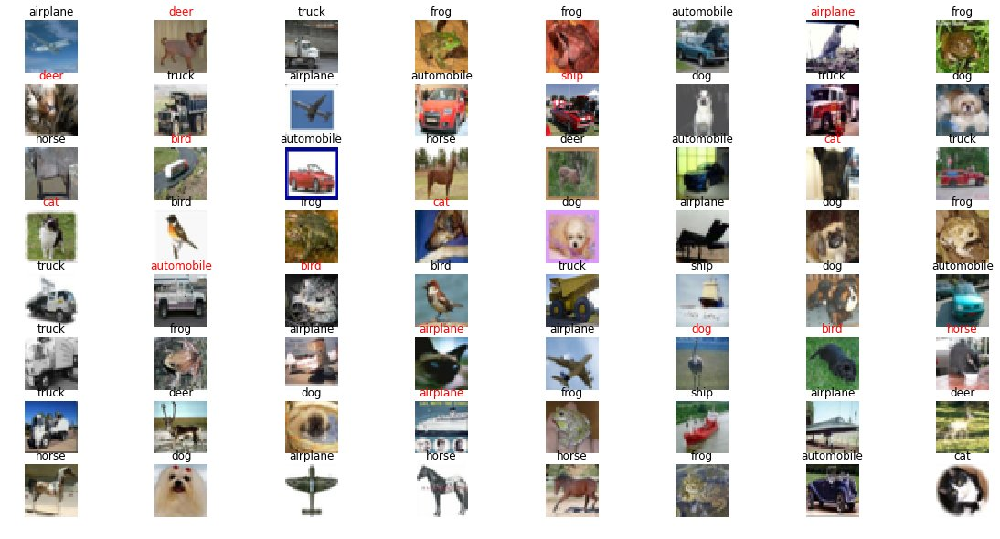

Epoch: 11 acc: 82.1500003338 score: 0.181213895967
airplane: 87.4, automobile: 91.7, bird: 74.9, cat: 51.9, deer: 78.4, dog: 81.9, frog: 91.7, horse: 81.6, ship: 90.2, truck: 91.8


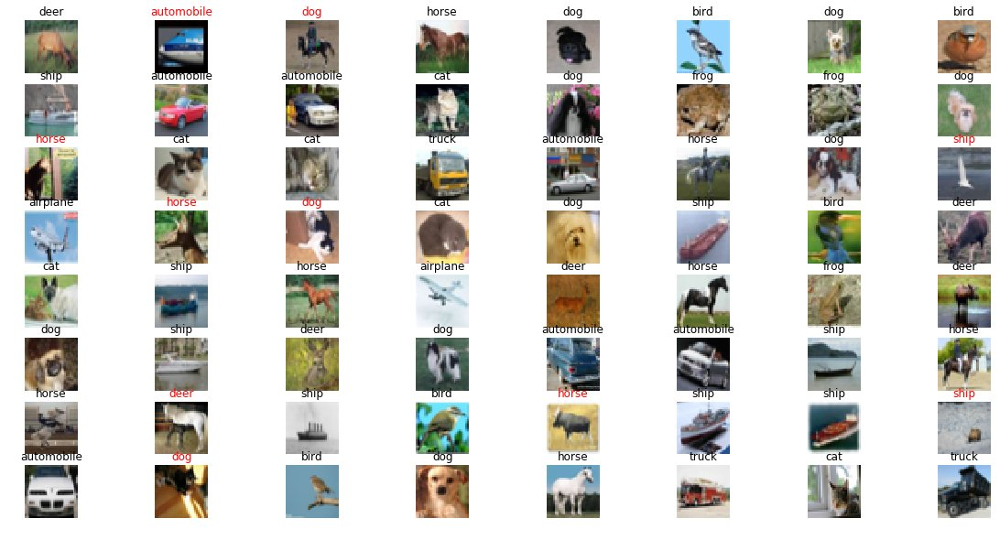

Saving


Epoch: 12 acc: 83.0399990082 score: 0.17319684951
airplane: 83.2, automobile: 95.1, bird: 80.1, cat: 67.6, deer: 81.3, dog: 70.0, frog: 89.7, horse: 86.6, ship: 89.6, truck: 87.2


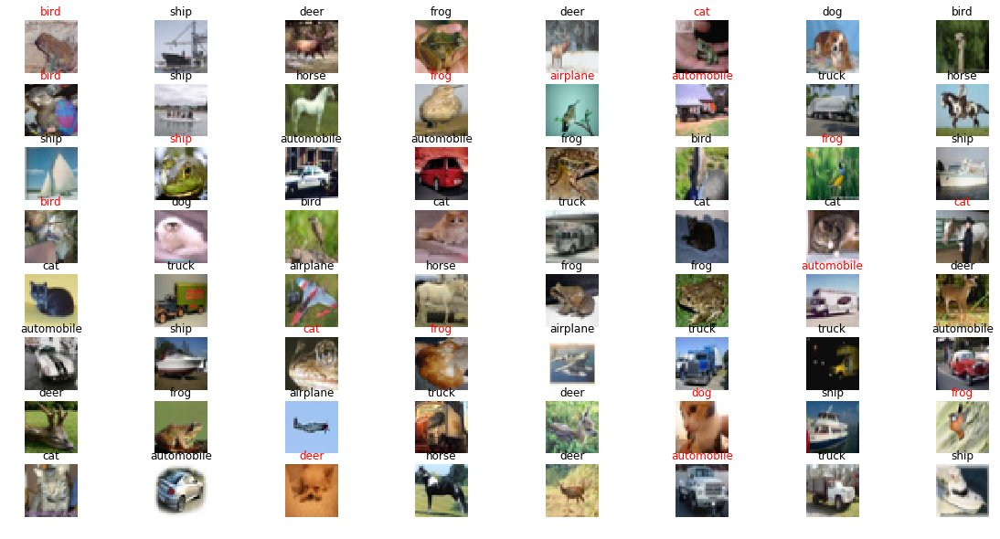

Saving


Epoch: 13 acc: 82.2399973869 score: 0.163409493102
airplane: 84.6, automobile: 88.2, bird: 82.7, cat: 65.9, deer: 67.8, dog: 81.2, frog: 89.3, horse: 81.8, ship: 92.5, truck: 88.4


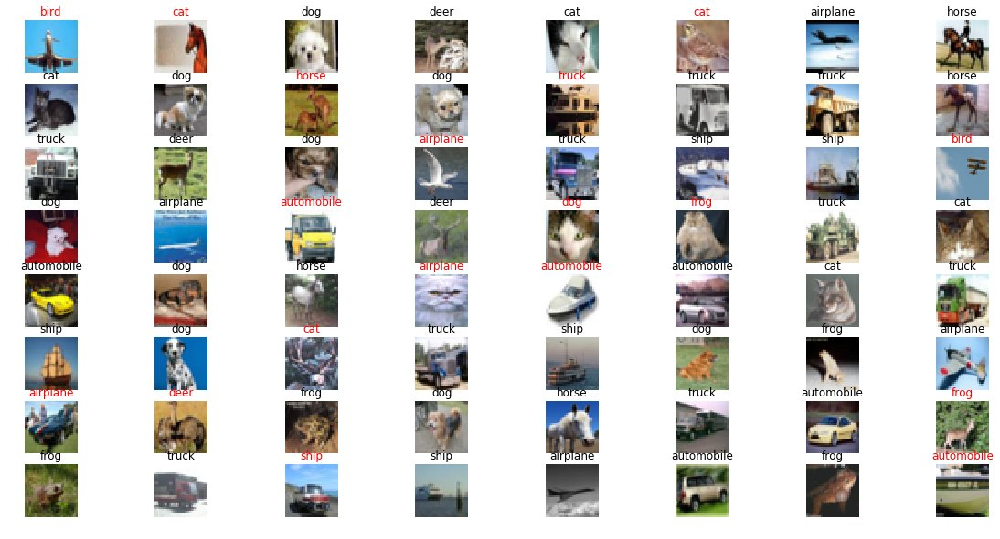

Epoch: 14 acc: 82.5999975204 score: 0.158499442361
airplane: 86.2, automobile: 92.2, bird: 64.9, cat: 63.9, deer: 82.9, dog: 76.1, frog: 92.4, horse: 88.1, ship: 86.7, truck: 92.6


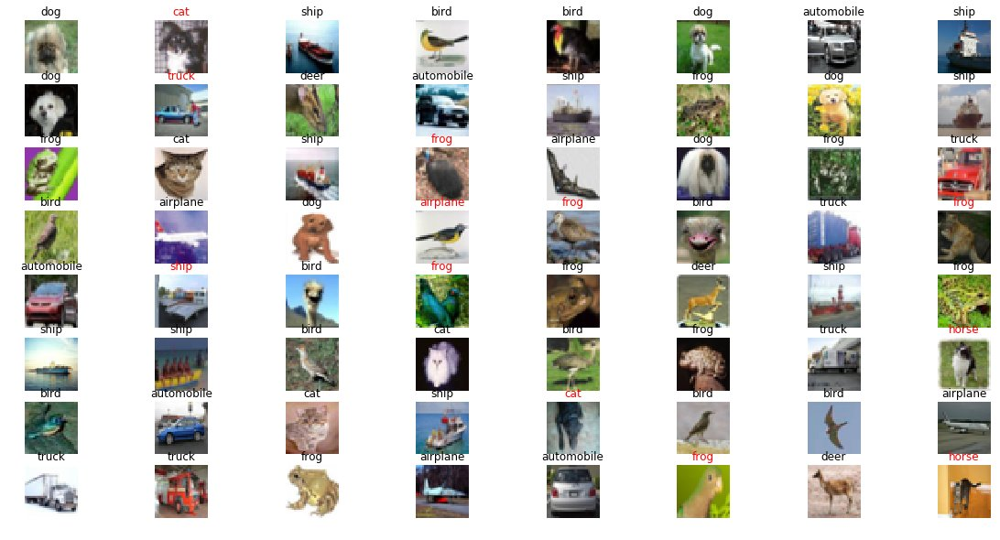

Epoch: 15 acc: 83.4699988365 score: 0.146838081791
airplane: 84.0, automobile: 90.7, bird: 75.8, cat: 65.0, deer: 82.9, dog: 82.7, frog: 86.5, horse: 87.2, ship: 85.7, truck: 94.2


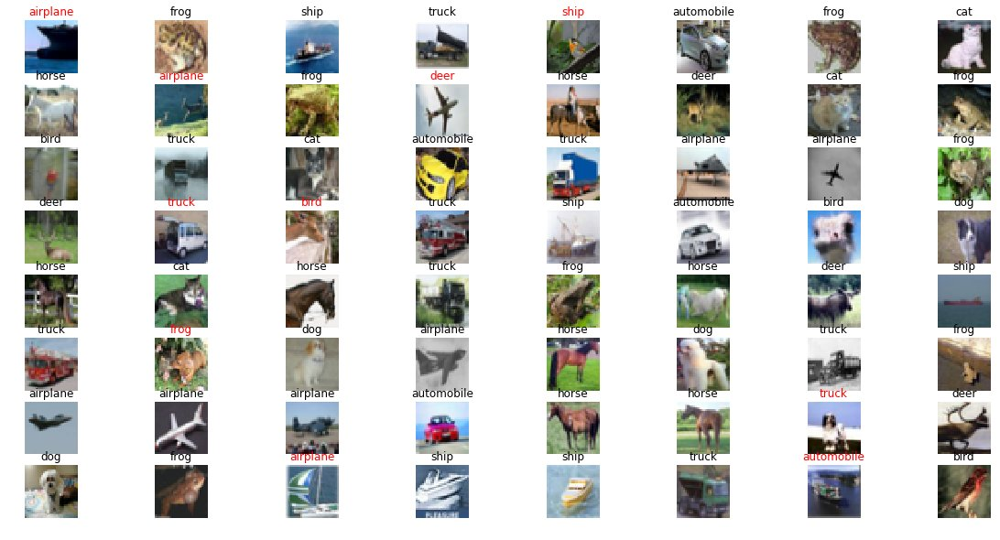

Saving


Epoch: 16 acc: 83.9900016785 score: 0.146937450687
airplane: 88.7, automobile: 94.7, bird: 78.9, cat: 75.5, deer: 86.1, dog: 64.4, frog: 85.9, horse: 87.3, ship: 89.1, truck: 89.3


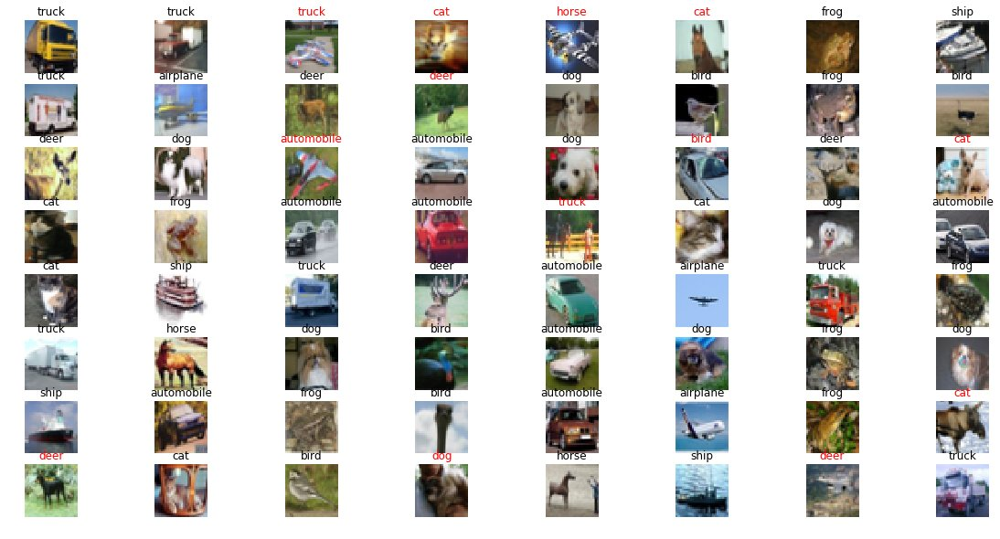

Saving


Epoch: 17 acc: 83.7499976158 score: 0.138001211346
airplane: 83.2, automobile: 90.9, bird: 76.6, cat: 69.4, deer: 80.6, dog: 78.5, frog: 91.3, horse: 82.2, ship: 91.6, truck: 93.2


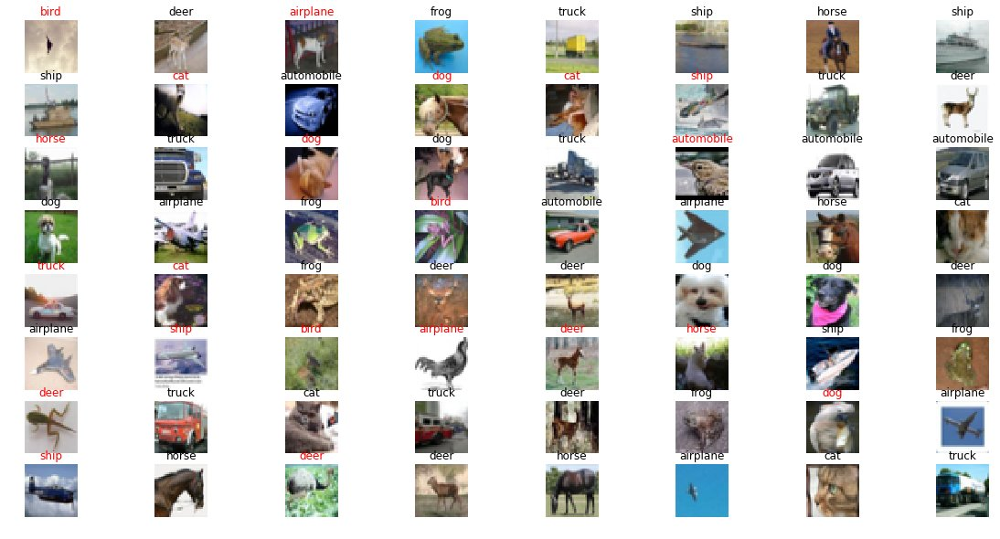

Epoch: 18 acc: 83.0799996853 score: 0.135356114701
airplane: 89.3, automobile: 90.0, bird: 72.0, cat: 67.5, deer: 80.7, dog: 82.8, frog: 79.4, horse: 91.9, ship: 88.9, truck: 88.3


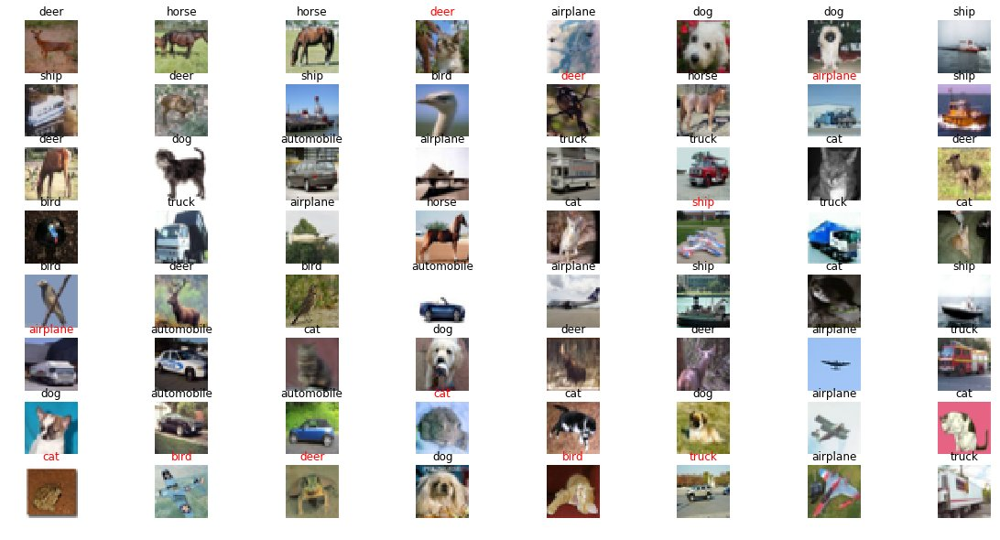

Epoch: 19 acc: 83.8900029659 score: 0.132613459073
airplane: 85.6, automobile: 91.1, bird: 77.0, cat: 62.4, deer: 87.1, dog: 79.1, frog: 90.2, horse: 82.8, ship: 90.2, truck: 93.4


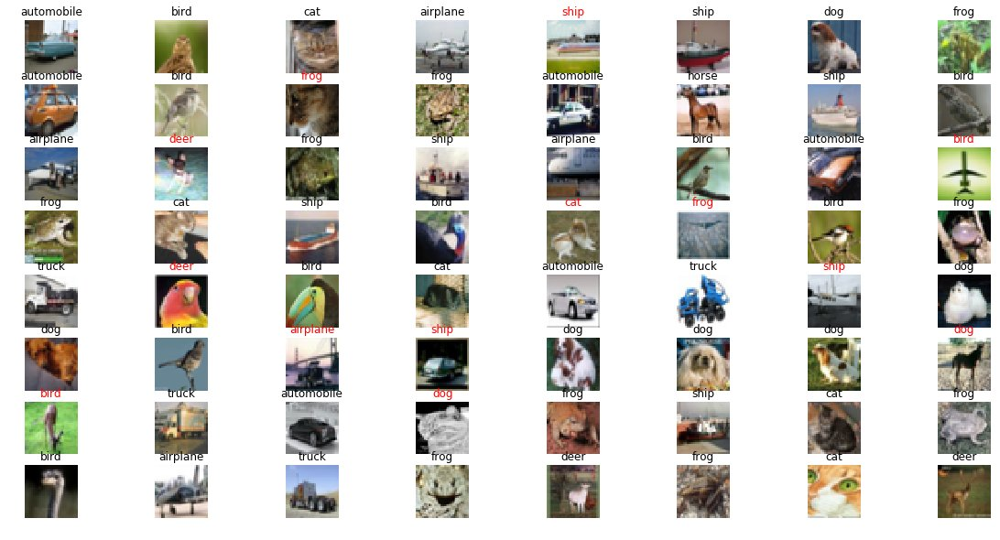

Epoch: 20 acc: 83.2899987698 score: 0.126130570679
airplane: 88.5, automobile: 95.1, bird: 71.2, cat: 70.5, deer: 78.7, dog: 71.1, frog: 86.8, horse: 89.6, ship: 90.5, truck: 90.9


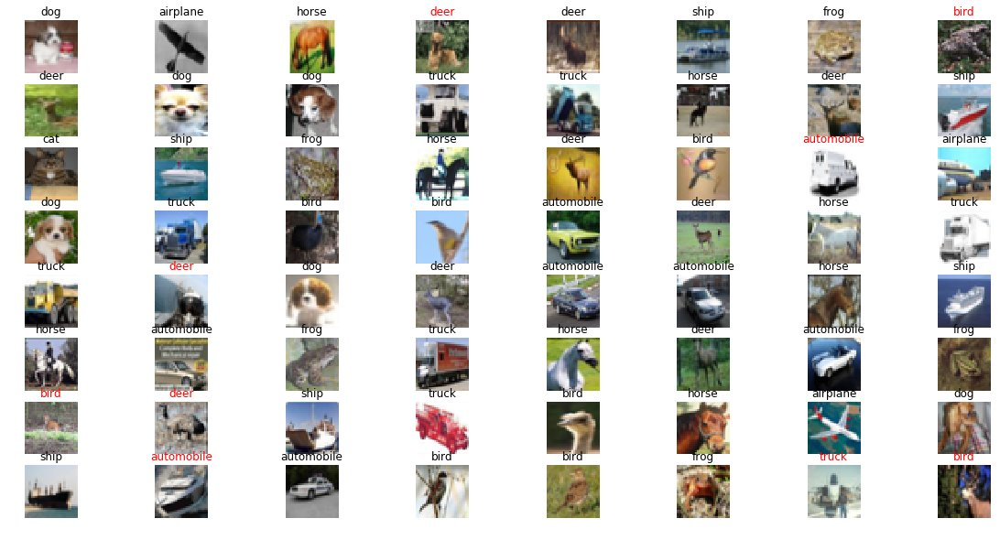

Epoch: 21 acc: 83.3299994469 score: 0.124482585593
airplane: 93.5, automobile: 92.5, bird: 74.7, cat: 67.6, deer: 82.1, dog: 73.2, frog: 80.9, horse: 93.2, ship: 85.7, truck: 89.9


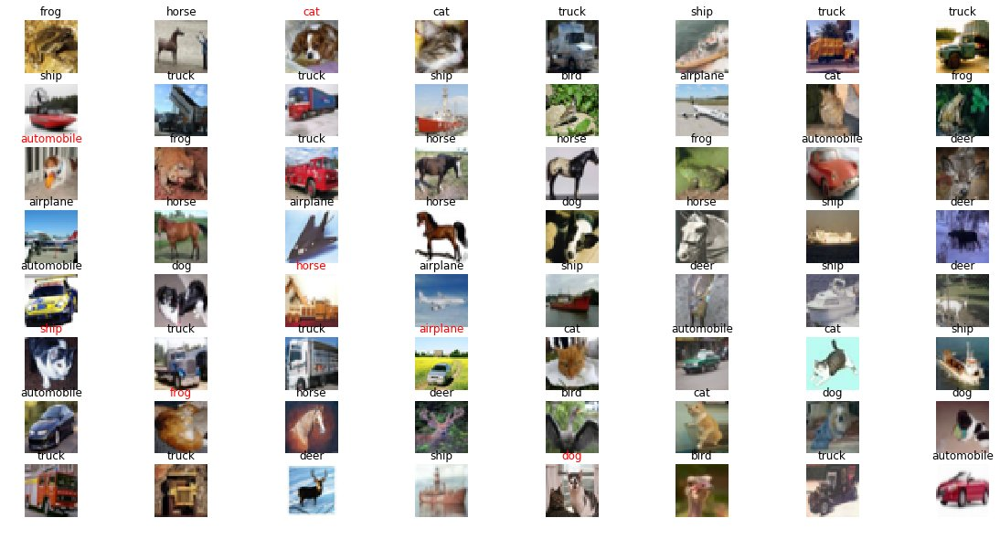

Epoch: 22 acc: 84.1400027275 score: 0.120420483579
airplane: 86.7, automobile: 93.4, bird: 77.1, cat: 68.0, deer: 87.4, dog: 71.5, frog: 83.6, horse: 91.0, ship: 91.5, truck: 91.2


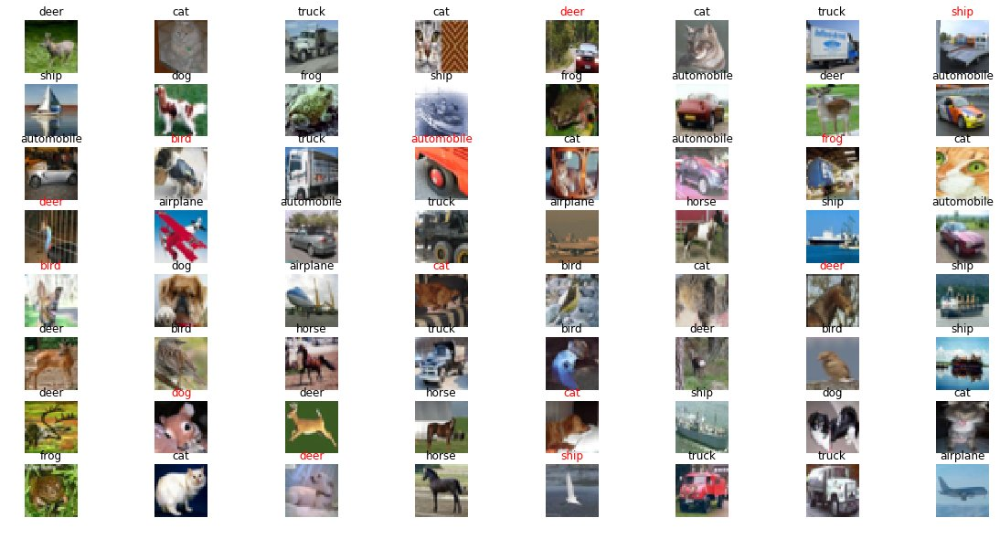

Saving


Epoch: 23 acc: 83.7400019169 score: 0.117669548321
airplane: 85.0, automobile: 92.2, bird: 74.5, cat: 70.1, deer: 89.4, dog: 78.5, frog: 82.6, horse: 86.6, ship: 89.1, truck: 89.4


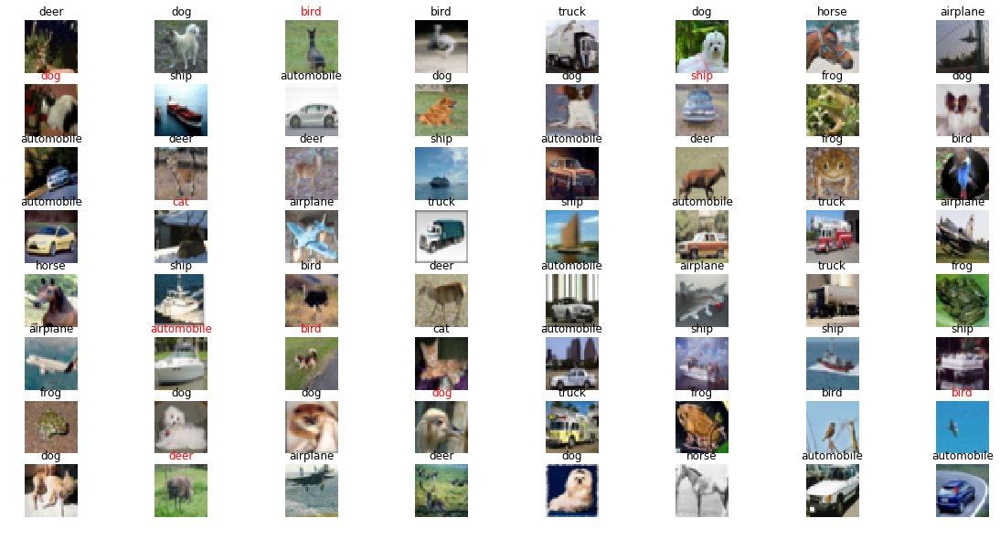

Epoch: 24 acc: 84.3699991703 score: 0.116022149448
airplane: 88.3, automobile: 92.5, bird: 79.7, cat: 68.5, deer: 82.1, dog: 70.5, frog: 91.1, horse: 91.1, ship: 90.9, truck: 89.0


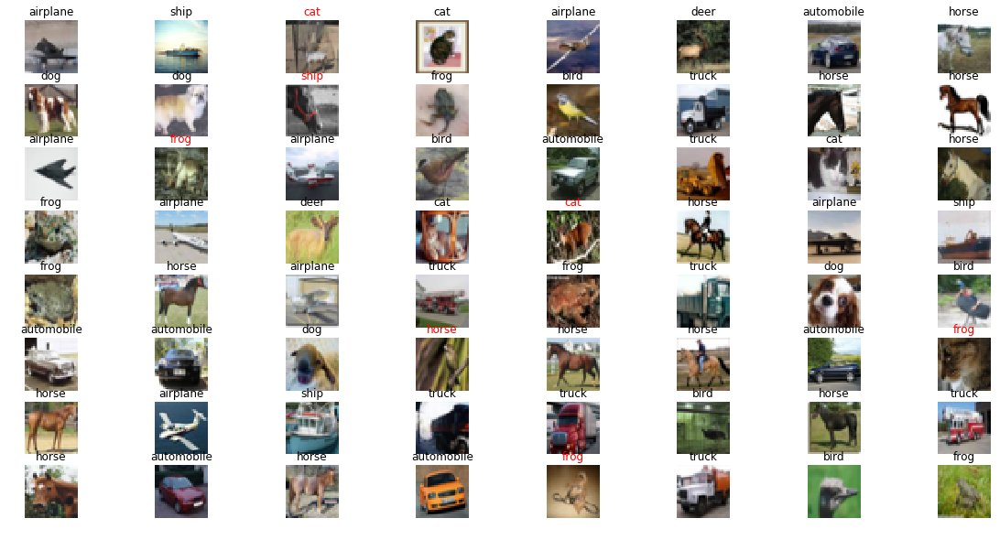

Saving


Epoch: 25 acc: 84.2800021172 score: 0.112082312657
airplane: 84.9, automobile: 94.1, bird: 78.2, cat: 69.2, deer: 80.1, dog: 82.0, frog: 83.9, horse: 85.1, ship: 95.4, truck: 89.9


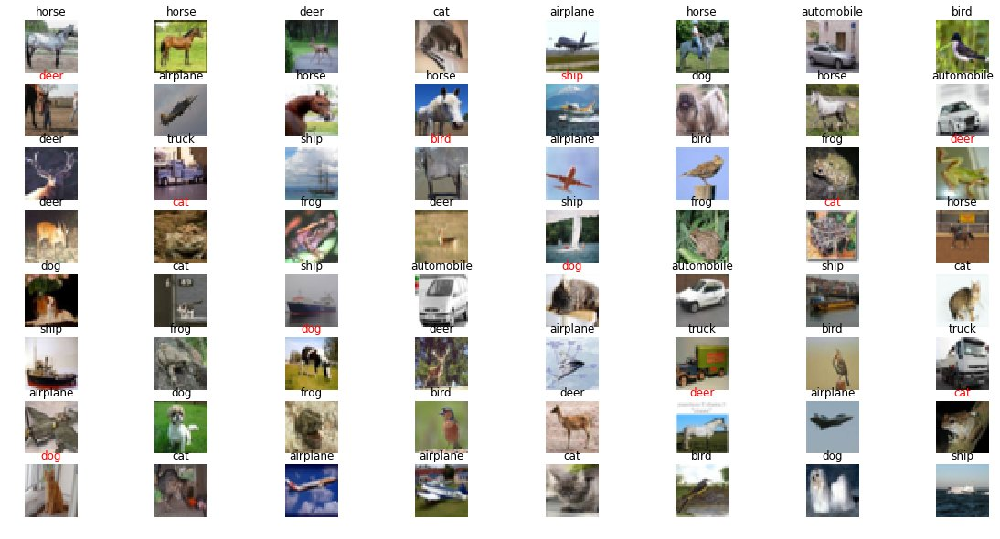

Epoch: 27 acc: 84.24000144 score: 0.108570971494
airplane: 83.4, automobile: 91.4, bird: 81.3, cat: 58.9, deer: 86.8, dog: 84.4, frog: 84.3, horse: 88.2, ship: 91.6, truck: 92.1


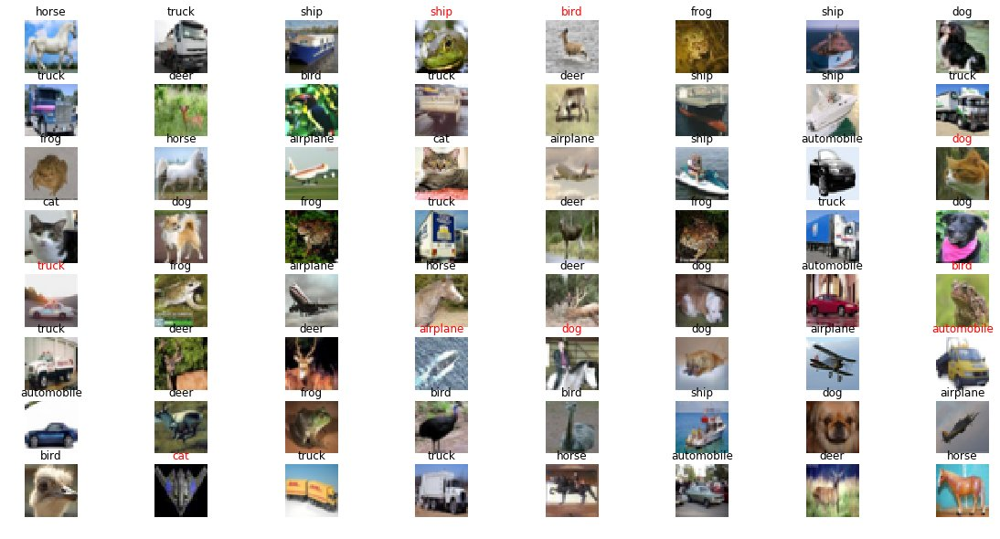

Epoch: 28 acc: 83.109998703 score: 0.103778727734
airplane: 80.7, automobile: 93.8, bird: 74.4, cat: 83.5, deer: 72.7, dog: 68.1, frog: 87.1, horse: 86.1, ship: 91.8, truck: 92.9


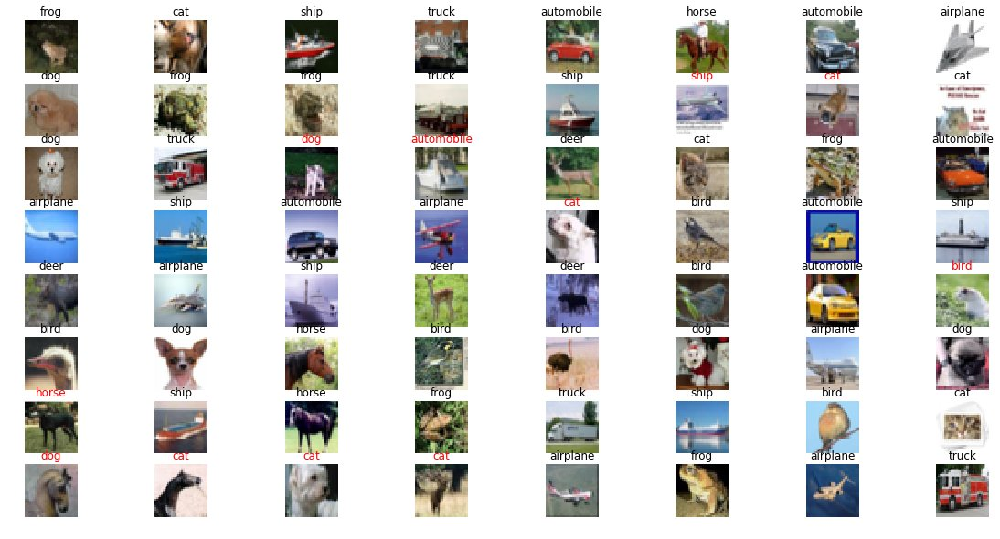

Epoch: 29 acc: 84.1600000858 score: 0.102976157499
airplane: 88.8, automobile: 95.4, bird: 77.9, cat: 65.1, deer: 81.8, dog: 78.8, frog: 91.6, horse: 82.6, ship: 88.3, truck: 91.3


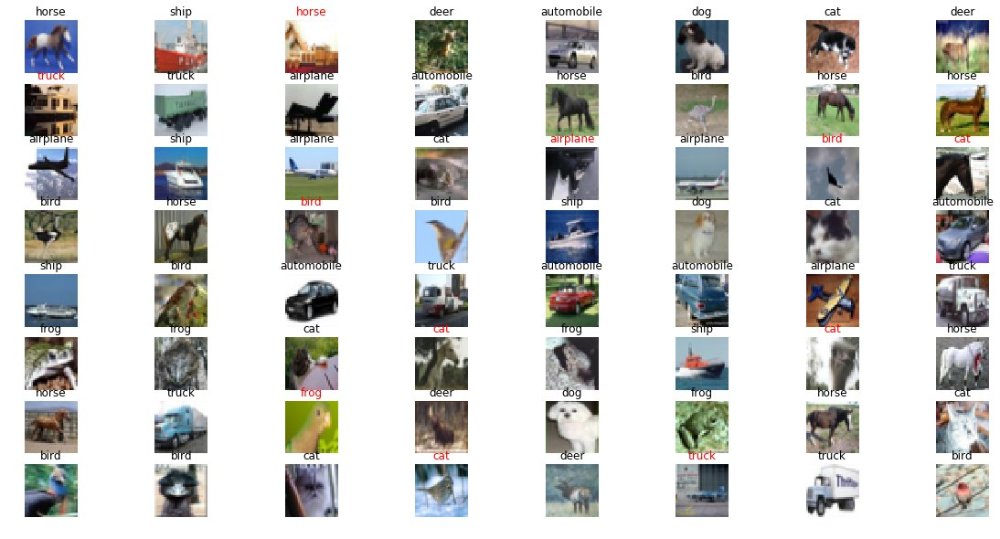

Epoch: 30 acc: 83.6399972439 score: 0.101515198572
airplane: 84.8, automobile: 95.6, bird: 76.8, cat: 85.6, deer: 80.4, dog: 65.5, frog: 82.3, horse: 87.3, ship: 89.7, truck: 88.4


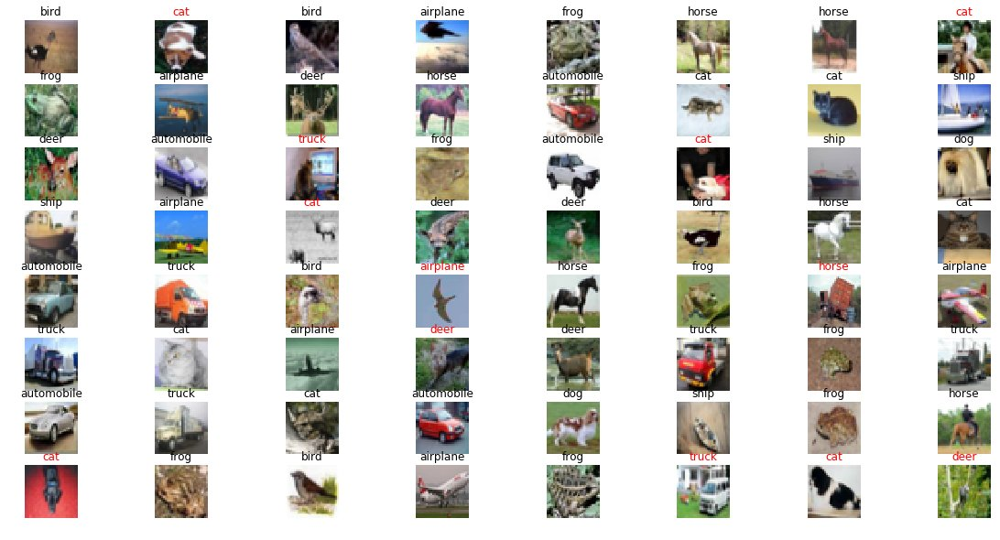

Epoch: 31 acc: 84.4500005245 score: 0.101019351486
airplane: 83.2, automobile: 89.5, bird: 83.1, cat: 71.6, deer: 86.3, dog: 73.6, frog: 87.9, horse: 84.2, ship: 93.4, truck: 91.7


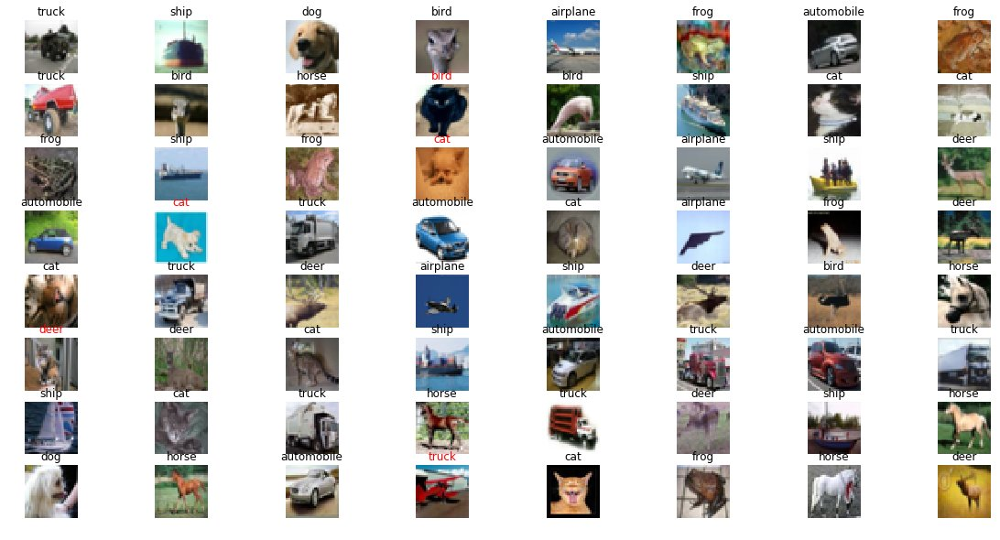

Saving


Epoch: 33 acc: 84.92000103 score: 0.0974363429902
airplane: 90.2, automobile: 90.3, bird: 78.1, cat: 74.4, deer: 82.4, dog: 77.9, frog: 88.4, horse: 85.7, ship: 92.9, truck: 88.9


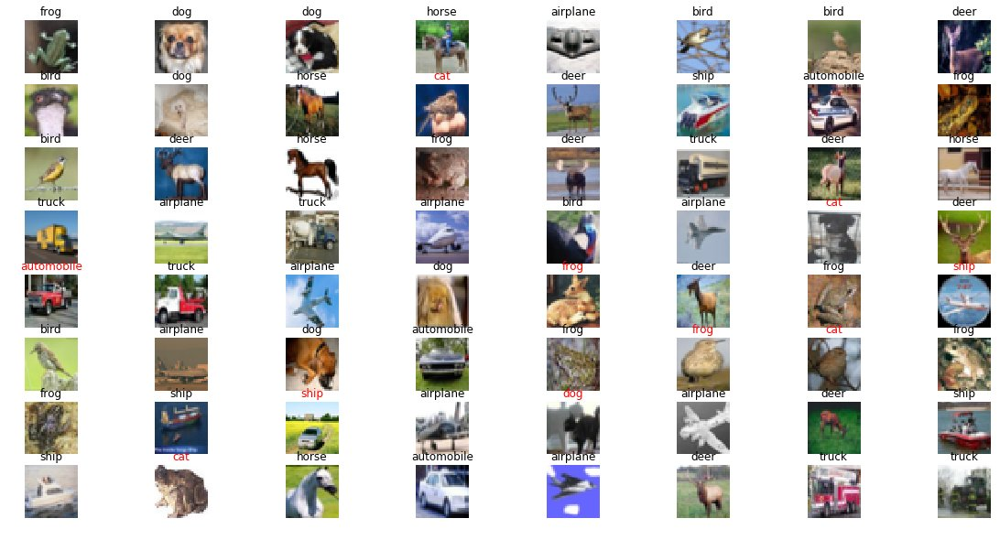

Epoch: 34 acc: 84.8800003529 score: 0.0961873183343
airplane: 84.8, automobile: 93.6, bird: 76.0, cat: 67.4, deer: 84.5, dog: 81.6, frog: 92.3, horse: 85.0, ship: 89.5, truck: 94.1


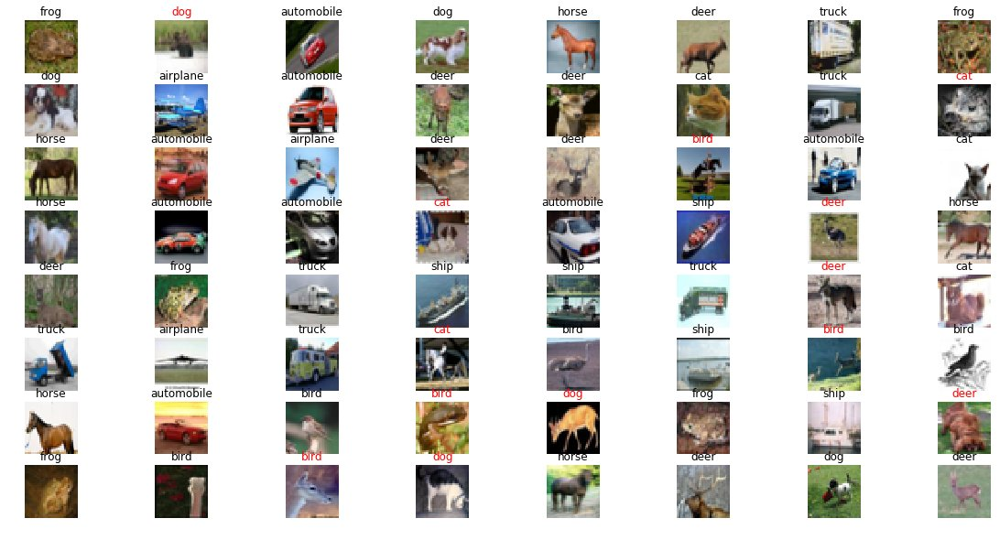

Epoch: 35 acc: 84.2999994755 score: 0.0949451253504
airplane: 84.6, automobile: 94.2, bird: 72.3, cat: 76.3, deer: 76.6, dog: 81.9, frog: 89.2, horse: 84.3, ship: 90.9, truck: 92.7


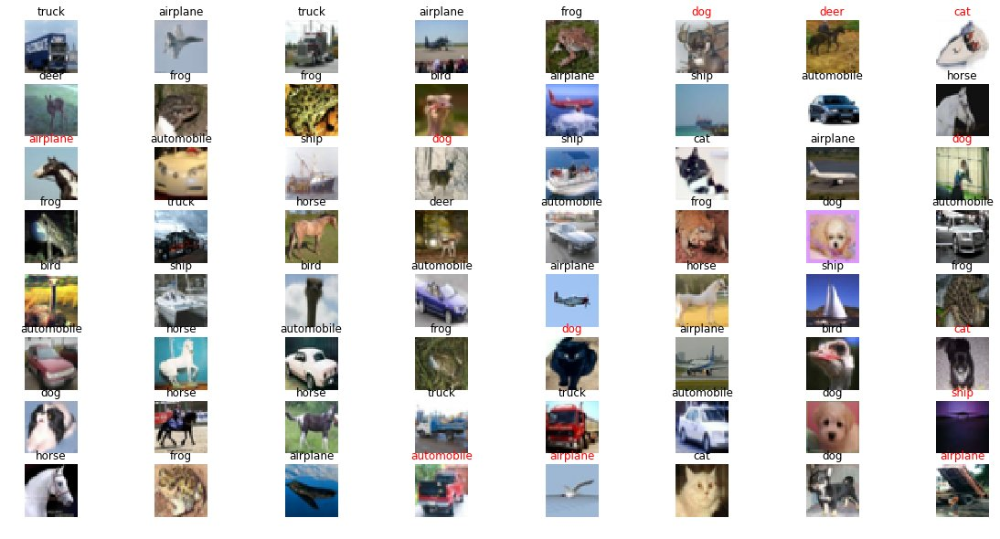

Epoch: 36 acc: 85.1300001144 score: 0.0904144743621
airplane: 84.6, automobile: 91.9, bird: 84.0, cat: 63.1, deer: 86.7, dog: 78.6, frog: 88.8, horse: 87.9, ship: 91.0, truck: 94.7


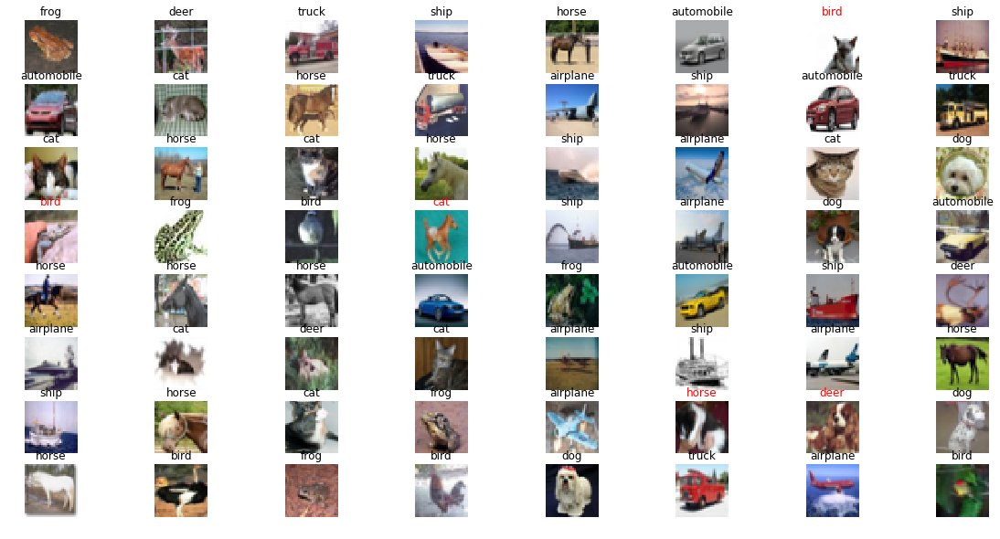

Epoch: 37 acc: 84.8900020123 score: 0.0910486108062
airplane: 89.8, automobile: 91.6, bird: 69.4, cat: 70.3, deer: 83.9, dog: 87.3, frog: 81.5, horse: 87.5, ship: 93.1, truck: 94.5


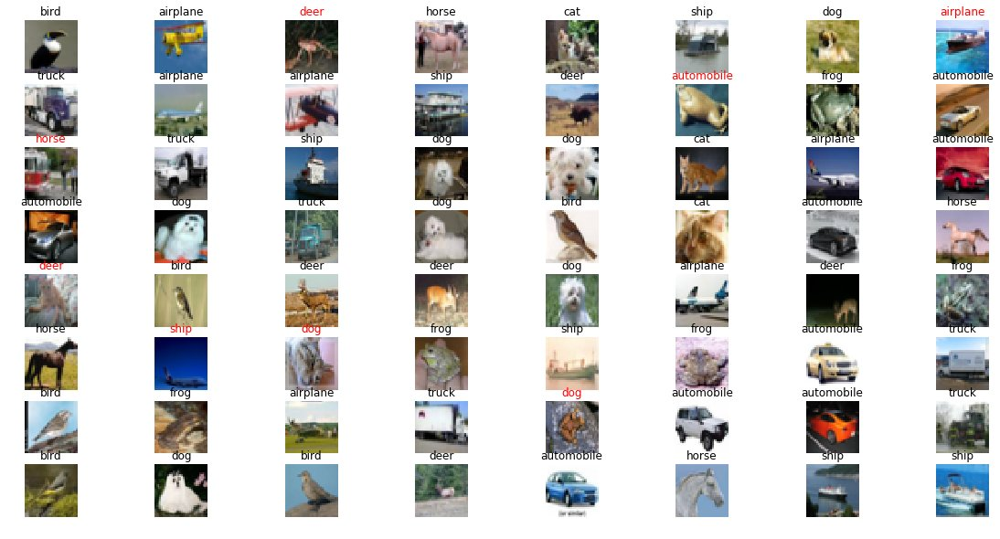

Epoch: 38 acc: 85.4700028896 score: 0.0903739892251
airplane: 83.8, automobile: 92.7, bird: 76.8, cat: 70.2, deer: 83.5, dog: 79.2, frog: 92.5, horse: 91.1, ship: 93.2, truck: 91.7


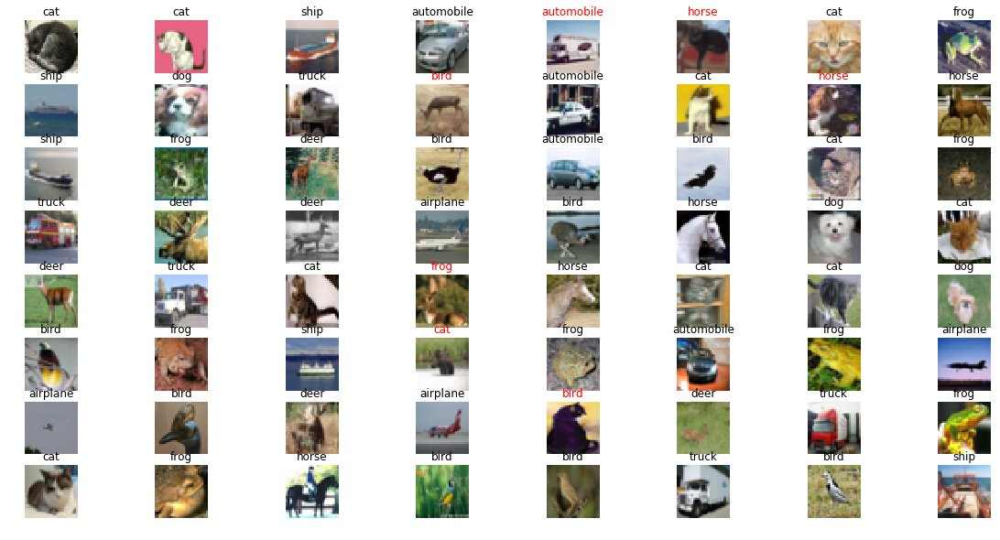

Saving


Epoch: 39 acc: 85.5099976063 score: 0.0876715053978
airplane: 89.7, automobile: 94.8, bird: 82.4, cat: 64.7, deer: 86.5, dog: 80.8, frog: 88.9, horse: 89.5, ship: 87.5, truck: 90.3


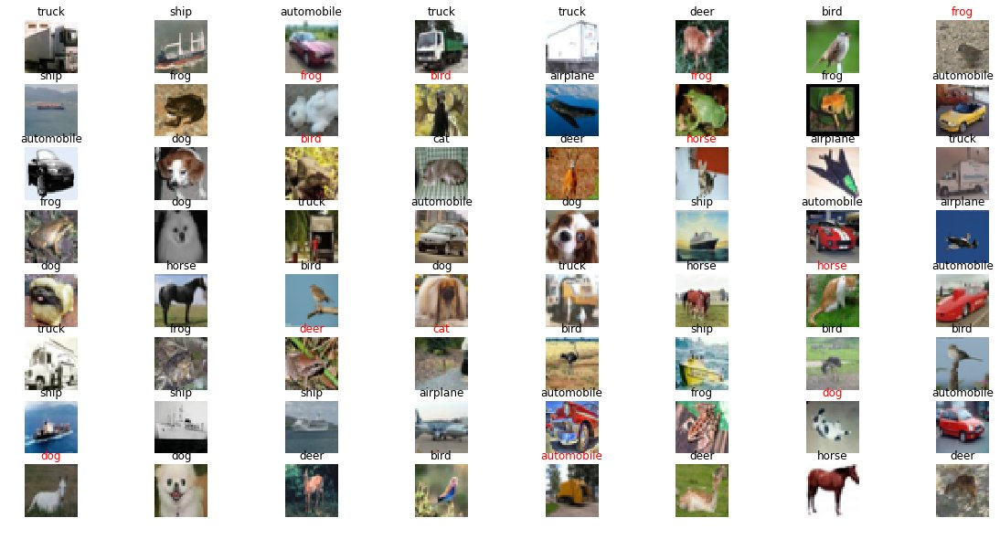

Saving


Epoch: 40 acc: 85.3100001812 score: 0.0901724823307
airplane: 85.7, automobile: 94.0, bird: 76.3, cat: 66.0, deer: 85.3, dog: 78.4, frog: 89.1, horse: 92.2, ship: 91.3, truck: 94.8


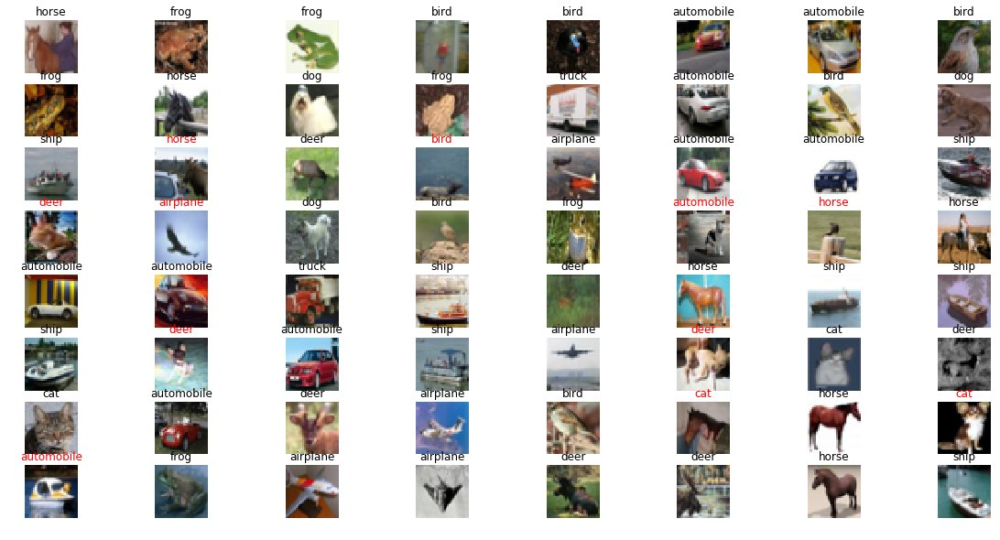

Epoch: 41 acc: 84.9500000477 score: 0.0889955434133
airplane: 88.8, automobile: 96.8, bird: 83.0, cat: 64.3, deer: 86.8, dog: 75.3, frog: 90.0, horse: 89.9, ship: 89.8, truck: 84.8


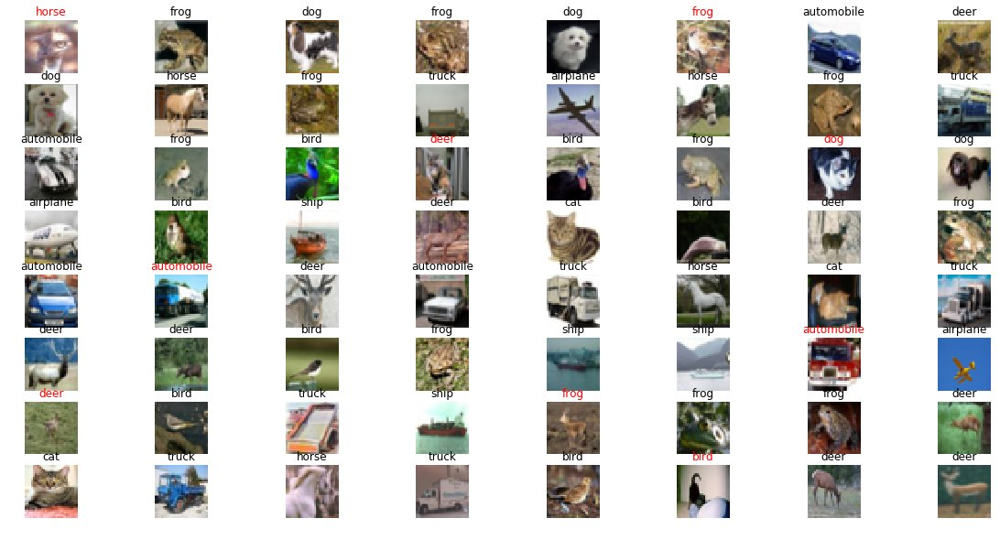

Epoch: 42 acc: 85.6700003147 score: 0.0835792503124
airplane: 90.4, automobile: 96.0, bird: 75.4, cat: 72.3, deer: 85.6, dog: 78.8, frog: 90.3, horse: 86.8, ship: 90.3, truck: 90.8


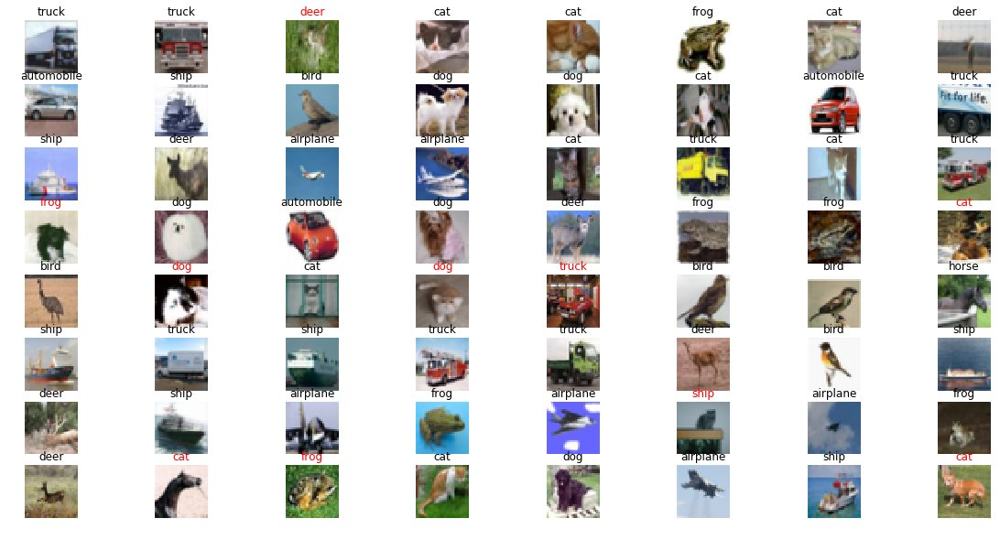

Saving


Epoch: 43 acc: 85.4200005531 score: 0.0845148814442
airplane: 88.5, automobile: 91.8, bird: 80.2, cat: 79.0, deer: 87.6, dog: 78.4, frog: 82.5, horse: 84.1, ship: 91.9, truck: 90.2


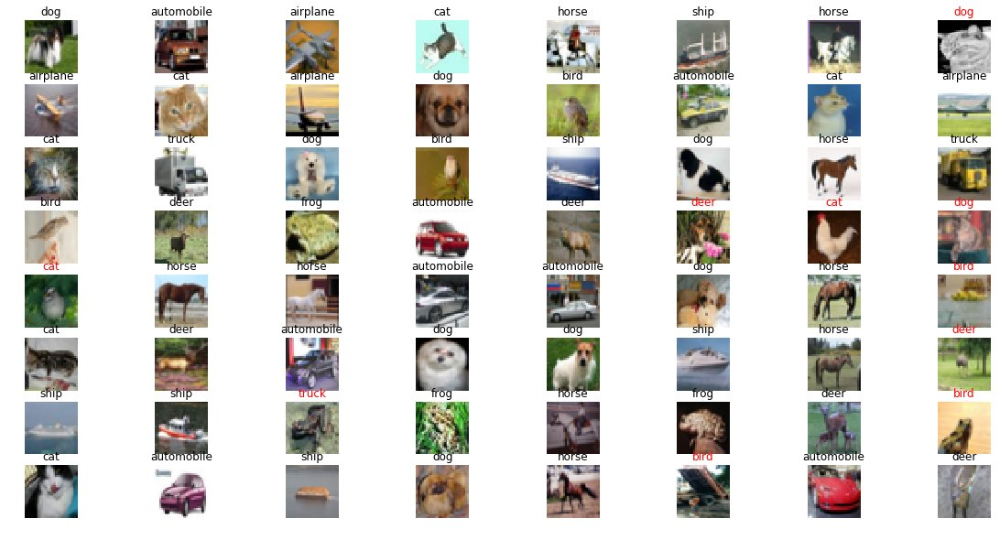

Epoch: 44 acc: 85.6999993324 score: 0.0847277662703
airplane: 89.7, automobile: 94.4, bird: 76.1, cat: 65.9, deer: 86.0, dog: 78.4, frog: 91.9, horse: 92.3, ship: 90.4, truck: 91.9


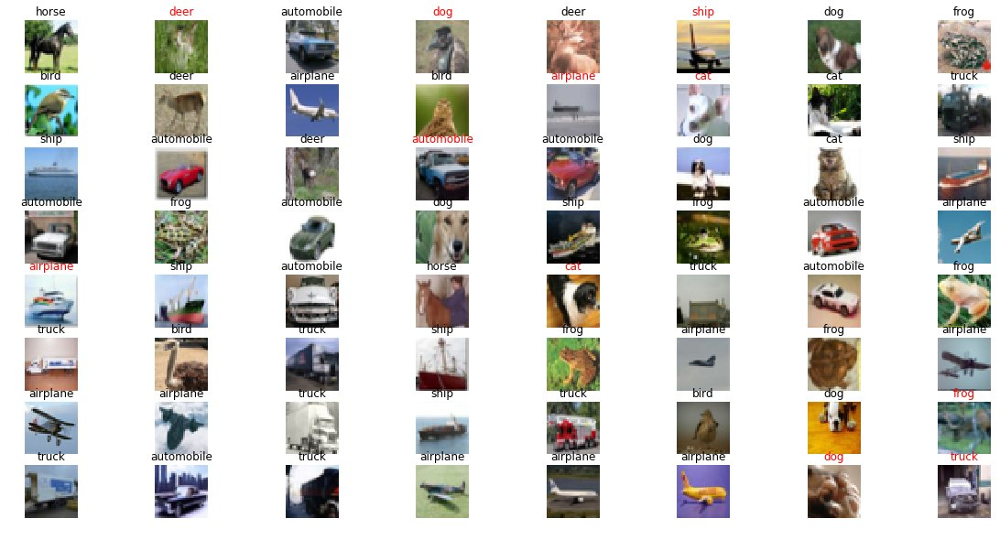

Saving


Epoch: 45 acc: 85.6199979782 score: 0.0794412579486
airplane: 86.5, automobile: 95.9, bird: 77.9, cat: 73.6, deer: 81.9, dog: 76.7, frog: 92.2, horse: 89.2, ship: 91.8, truck: 90.5


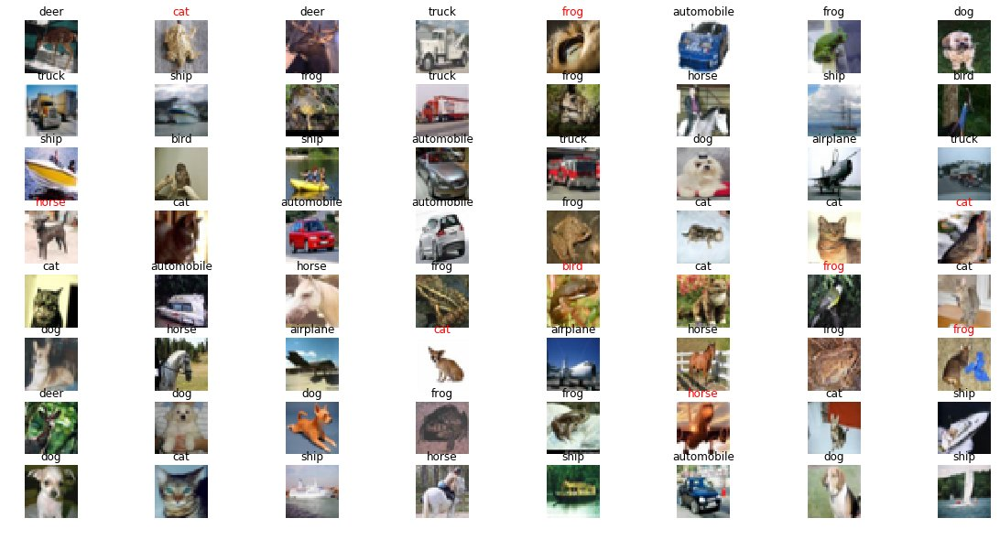

Epoch: 46 acc: 85.7100009918 score: 0.0819745698224
airplane: 87.6, automobile: 92.7, bird: 83.9, cat: 75.4, deer: 89.7, dog: 74.5, frog: 84.7, horse: 85.3, ship: 90.2, truck: 93.1


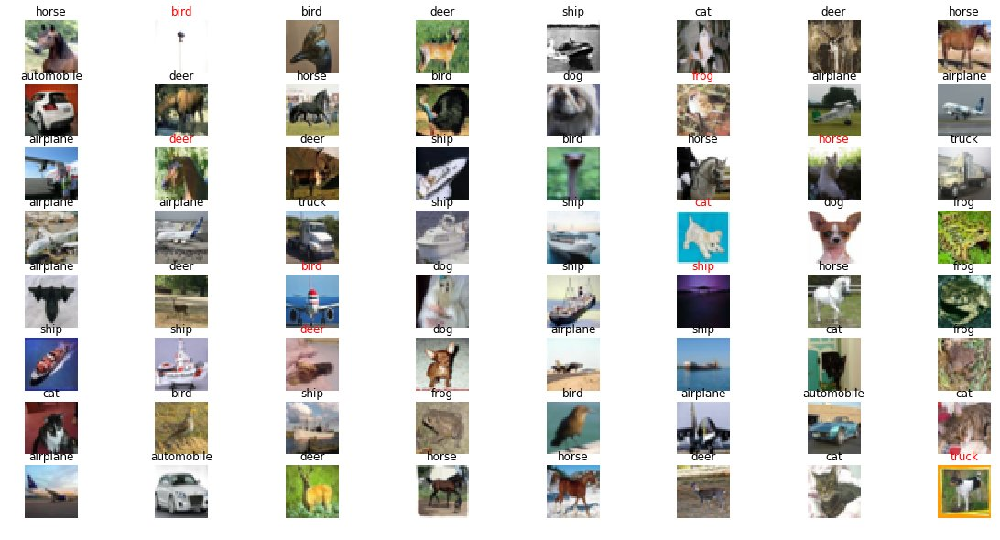

Saving


Epoch: 47 acc: 85.4099988937 score: 0.0800157574697
airplane: 89.1, automobile: 91.5, bird: 82.0, cat: 71.6, deer: 79.4, dog: 81.5, frog: 89.8, horse: 85.8, ship: 88.9, truck: 94.5


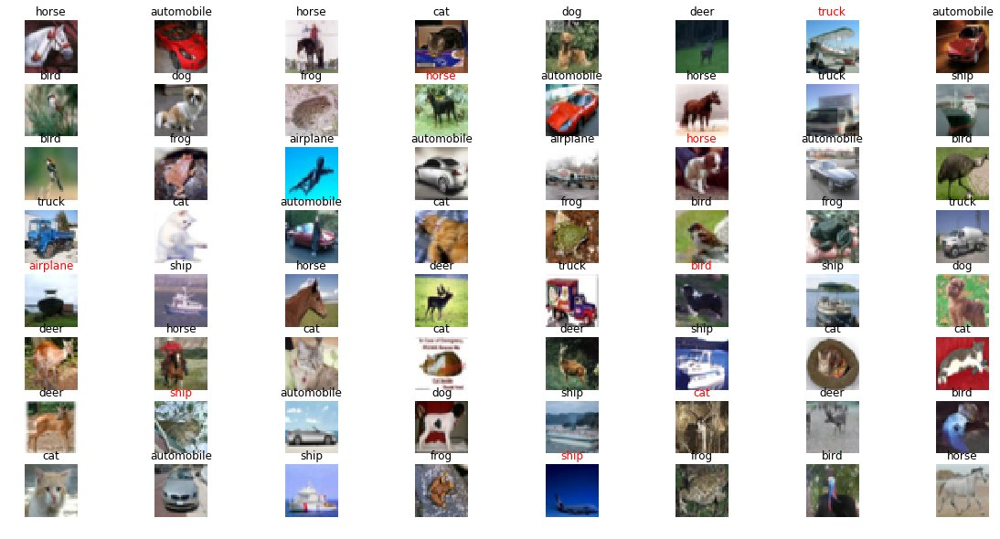

Epoch: 48 acc: 84.7000002861 score: 0.0796574210836
airplane: 84.1, automobile: 95.7, bird: 79.5, cat: 71.5, deer: 78.2, dog: 82.1, frog: 86.8, horse: 88.6, ship: 88.9, truck: 91.6


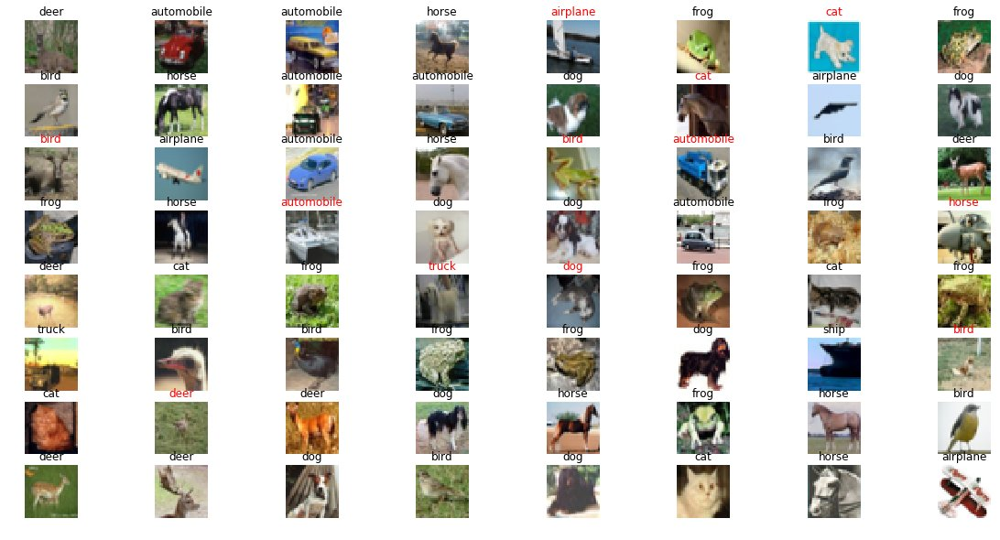

Epoch: 49 acc: 85.490000248 score: 0.0788391504688
airplane: 87.6, automobile: 96.9, bird: 77.8, cat: 70.6, deer: 86.6, dog: 79.4, frog: 92.2, horse: 85.1, ship: 90.3, truck: 88.4


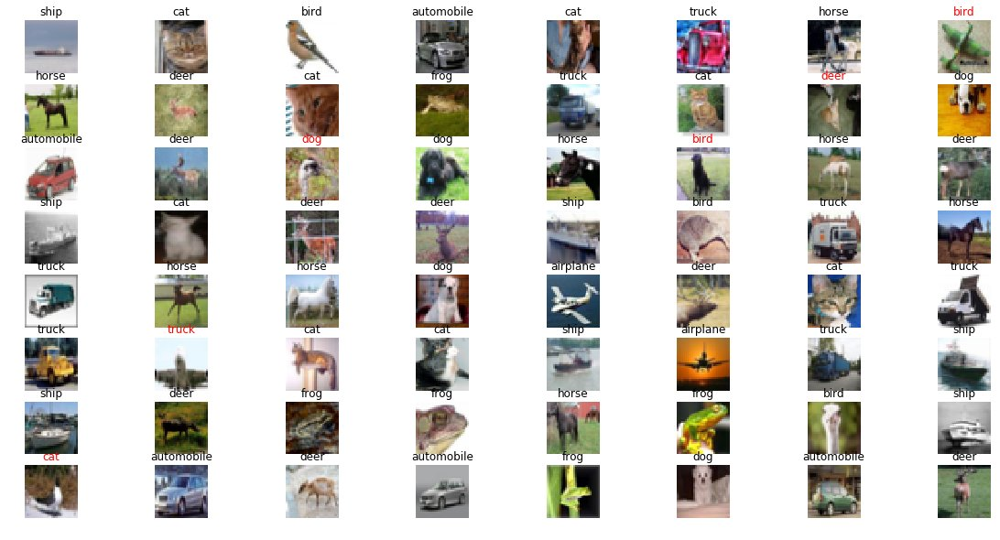

Epoch: 50 acc: 84.6000015736 score: 0.0764031878507
airplane: 85.5, automobile: 92.3, bird: 68.5, cat: 70.3, deer: 79.8, dog: 86.1, frog: 84.5, horse: 90.2, ship: 93.9, truck: 94.9


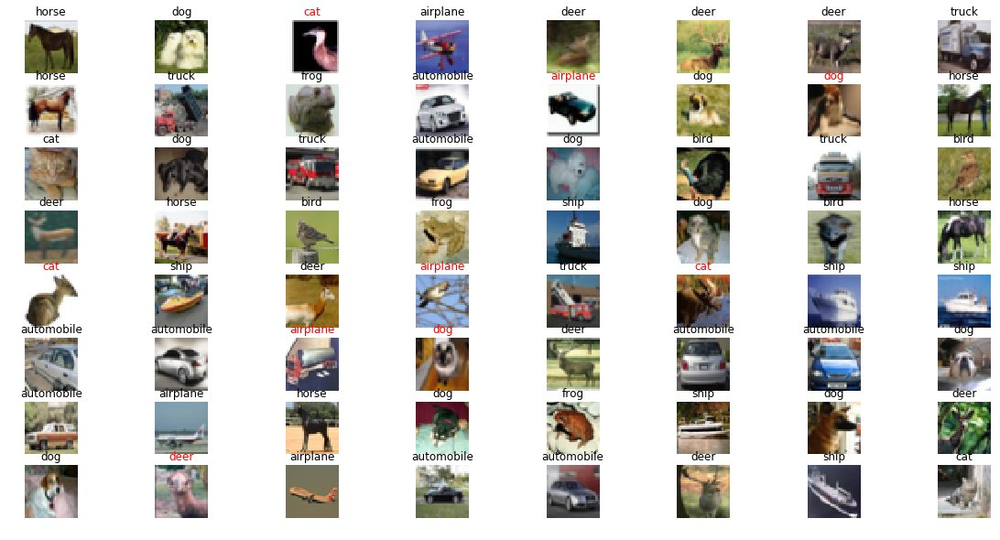

Epoch: 51 acc: 85.1400017738 score: 0.0800865757525
airplane: 88.3, automobile: 96.6, bird: 74.3, cat: 69.5, deer: 79.7, dog: 82.4, frog: 92.6, horse: 89.9, ship: 88.9, truck: 89.2


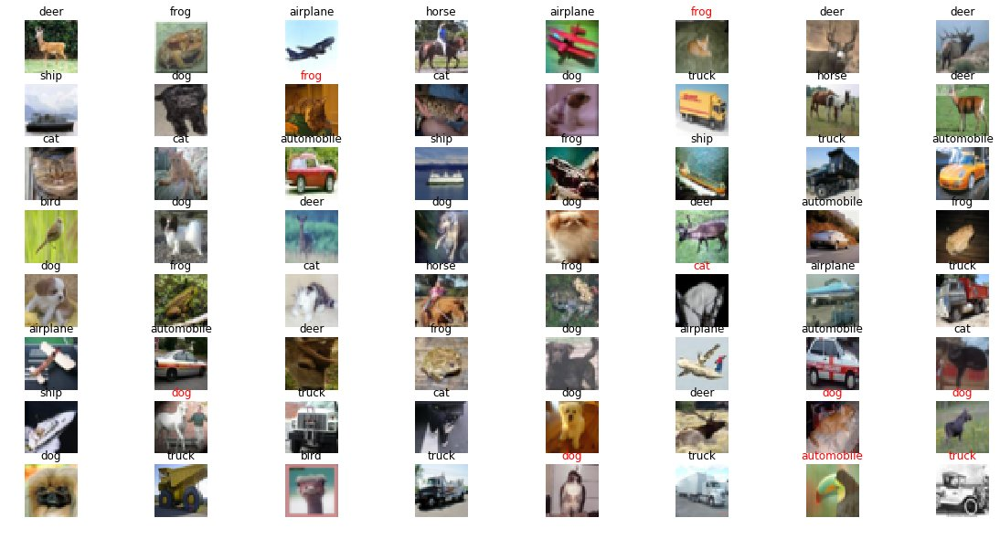

Epoch: 52 acc: 85.5799973011 score: 0.0771800063032
airplane: 82.2, automobile: 91.0, bird: 79.9, cat: 63.4, deer: 86.8, dog: 84.1, frog: 91.2, horse: 93.0, ship: 93.4, truck: 90.8


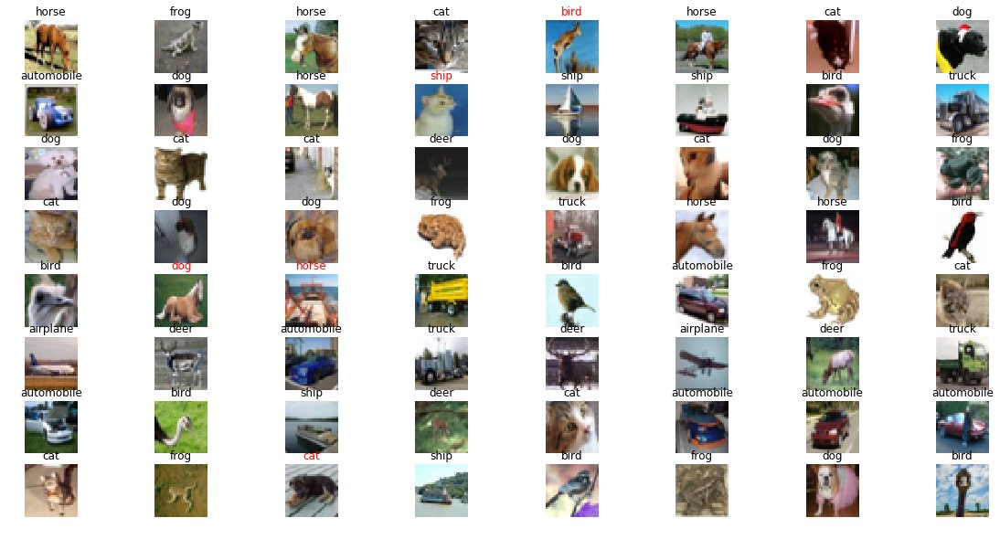

Epoch: 53 acc: 86.7299973965 score: 0.0736991009372
airplane: 88.3, automobile: 94.9, bird: 82.2, cat: 74.1, deer: 87.1, dog: 78.0, frog: 90.8, horse: 89.8, ship: 89.9, truck: 92.2


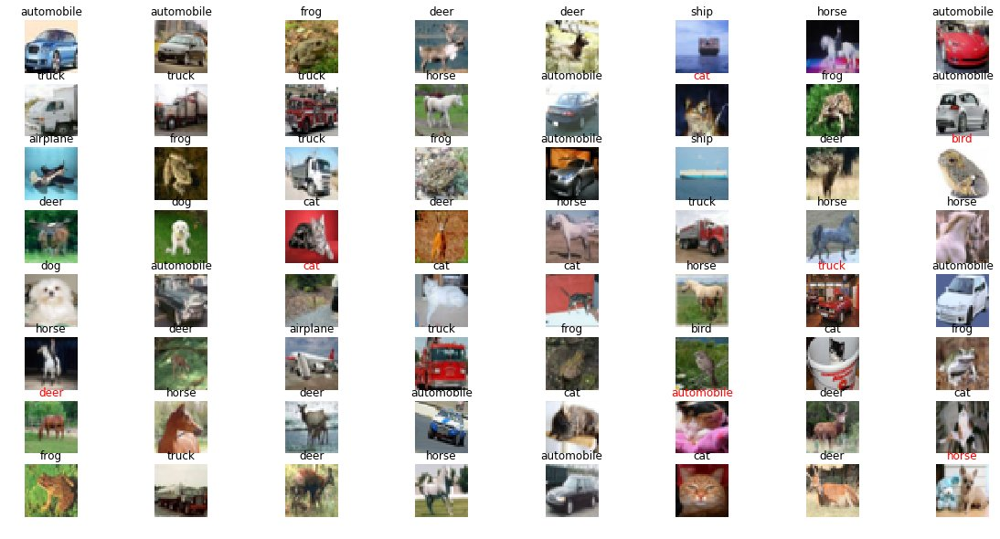

Saving


Epoch: 54 acc: 86.0199987888 score: 0.0757904821637
airplane: 85.3, automobile: 93.3, bird: 82.3, cat: 67.0, deer: 88.8, dog: 80.0, frog: 91.5, horse: 89.4, ship: 92.1, truck: 90.5


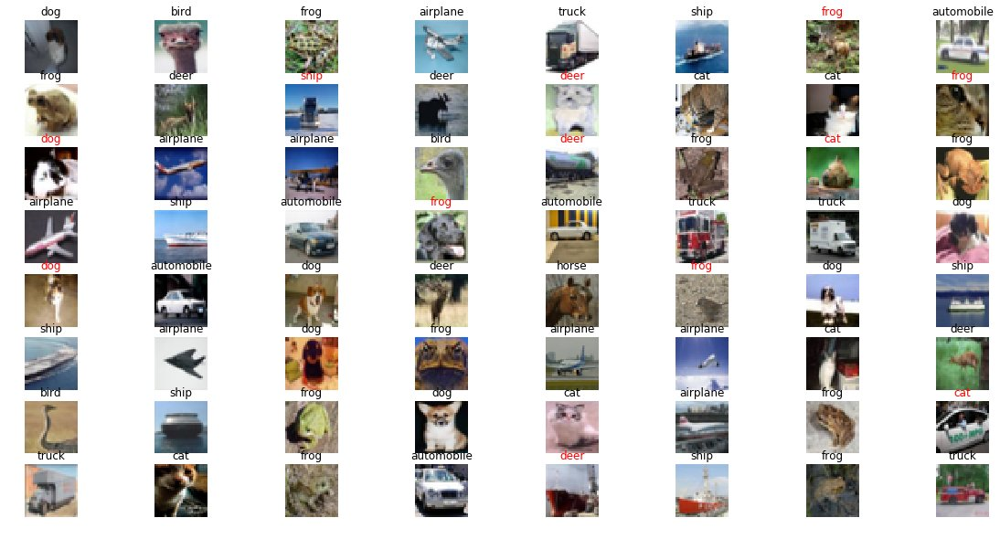

Epoch: 55 acc: 85.8699977398 score: 0.0751270111803
airplane: 85.7, automobile: 93.4, bird: 80.4, cat: 70.3, deer: 86.0, dog: 81.0, frog: 93.1, horse: 88.2, ship: 88.8, truck: 91.8


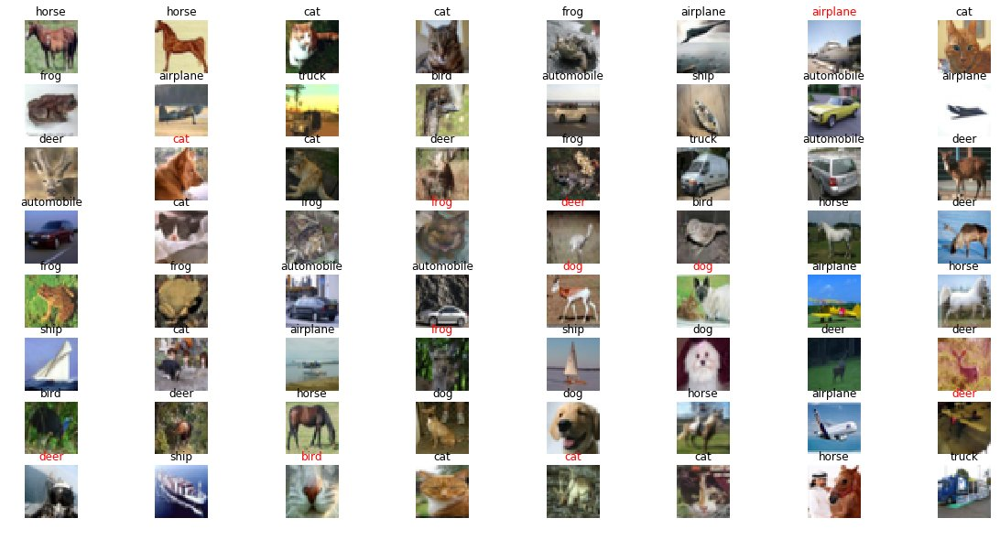

Epoch: 56 acc: 86.1800014973 score: 0.0725541989374
airplane: 88.9, automobile: 92.4, bird: 81.6, cat: 68.4, deer: 89.2, dog: 80.4, frog: 85.3, horse: 89.4, ship: 92.4, truck: 93.8


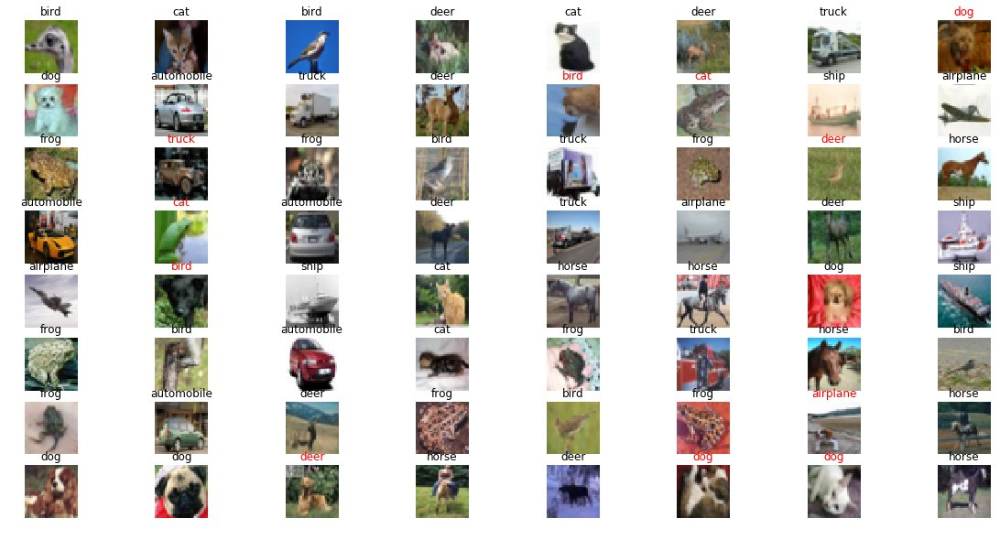

Epoch: 57 acc: 86.4099979401 score: 0.0728028984112
airplane: 87.3, automobile: 92.7, bird: 81.0, cat: 72.7, deer: 84.9, dog: 81.6, frog: 91.7, horse: 85.7, ship: 91.6, truck: 94.9


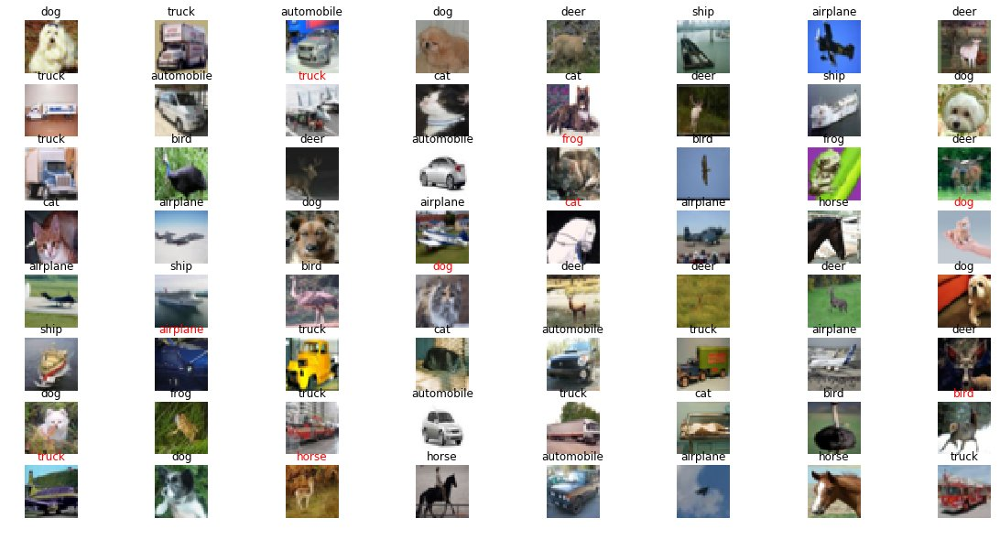

Epoch: 58 acc: 86.0499978065 score: 0.0700380278633
airplane: 83.1, automobile: 93.8, bird: 78.2, cat: 80.6, deer: 84.7, dog: 76.7, frog: 89.7, horse: 90.1, ship: 93.0, truck: 90.6


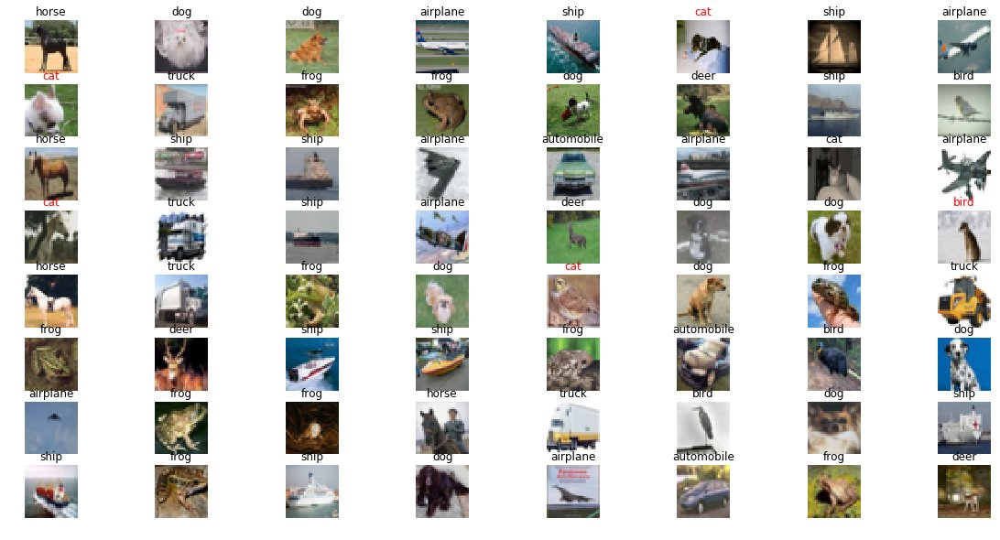

Epoch: 59 acc: 86.4099979401 score: 0.071870164161
airplane: 89.5, automobile: 94.0, bird: 81.8, cat: 74.8, deer: 89.8, dog: 78.4, frog: 88.1, horse: 85.4, ship: 92.8, truck: 89.5


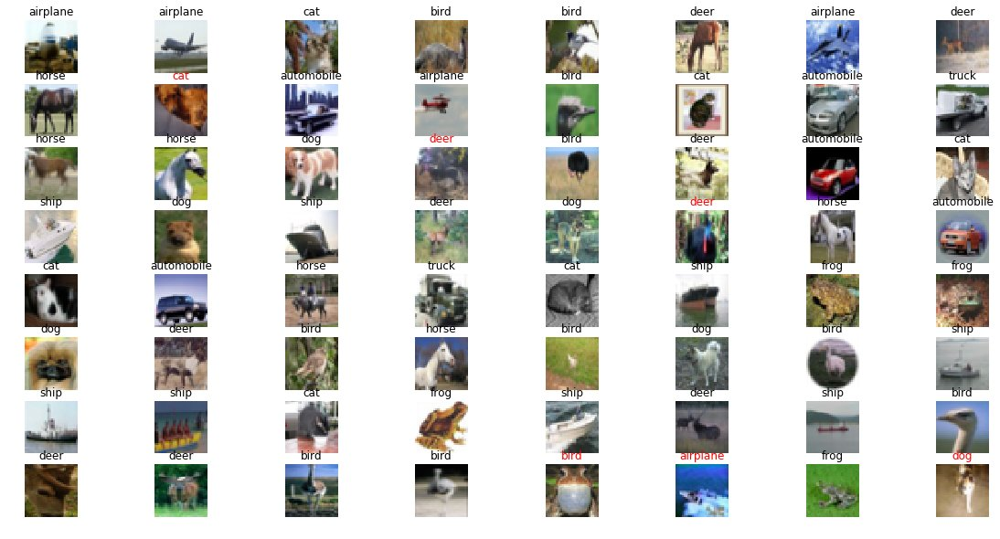

Epoch: 60 acc: 86.1899971962 score: 0.0695523104434
airplane: 83.3, automobile: 95.0, bird: 81.3, cat: 76.9, deer: 87.6, dog: 78.7, frog: 89.7, horse: 90.0, ship: 89.7, truck: 89.7


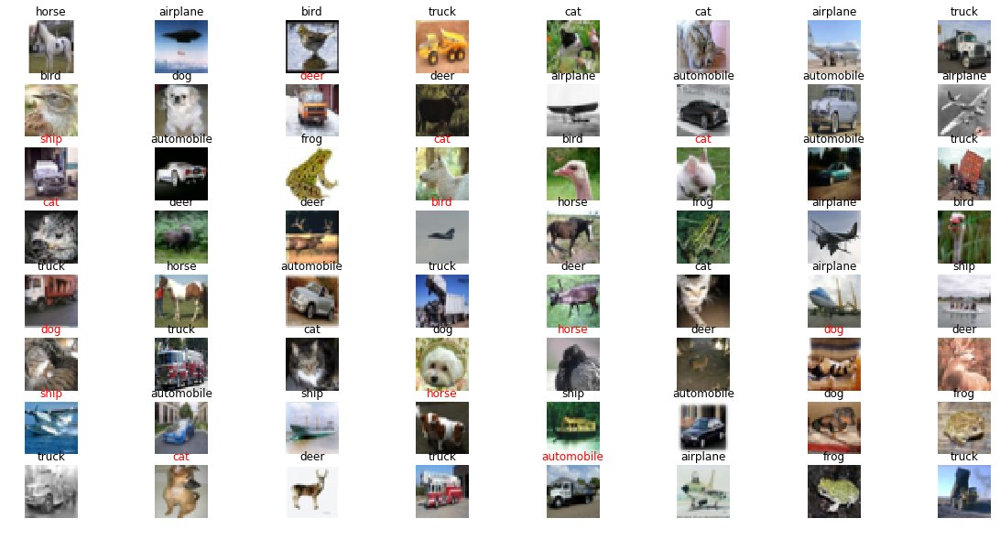

Epoch: 61 acc: 85.8699977398 score: 0.0695569306642
airplane: 85.2, automobile: 93.8, bird: 82.6, cat: 68.8, deer: 76.5, dog: 83.7, frog: 91.3, horse: 90.4, ship: 93.8, truck: 92.6


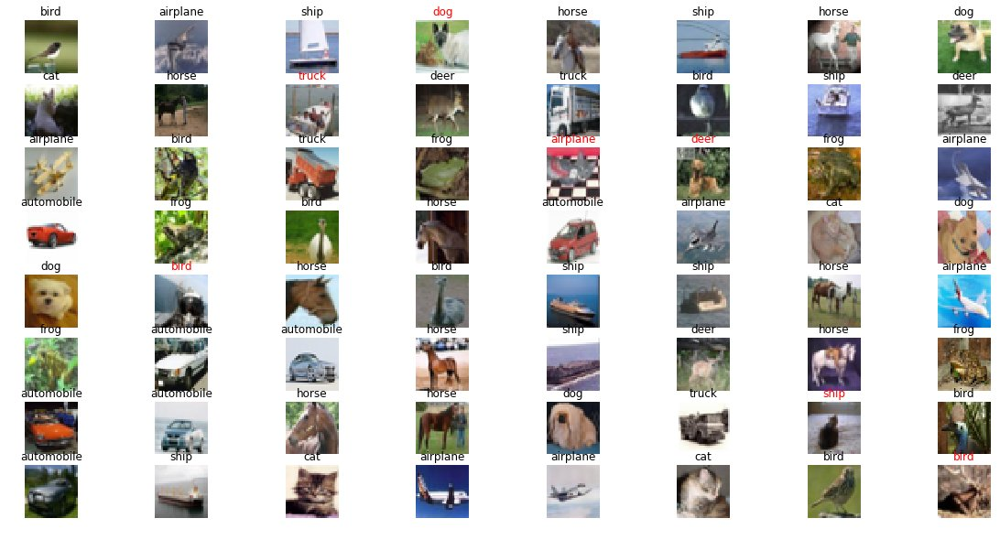

Epoch: 62 acc: 85.6700003147 score: 0.0703733986461
airplane: 83.9, automobile: 93.3, bird: 84.1, cat: 70.2, deer: 80.4, dog: 82.0, frog: 89.6, horse: 87.4, ship: 92.2, truck: 93.6


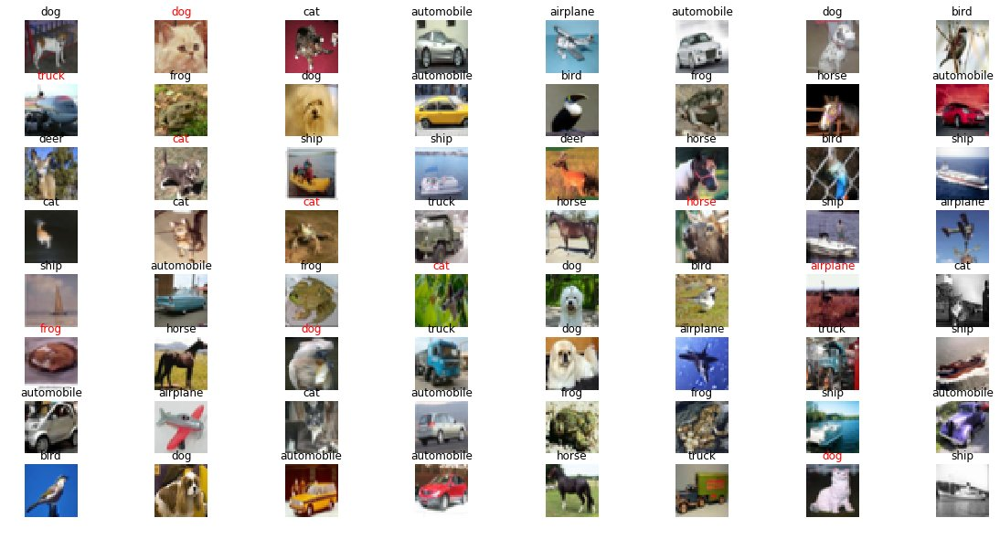

Epoch: 63 acc: 86.1500024796 score: 0.0693586302354
airplane: 92.1, automobile: 96.7, bird: 84.7, cat: 69.0, deer: 80.3, dog: 81.0, frog: 89.8, horse: 86.9, ship: 91.0, truck: 90.0


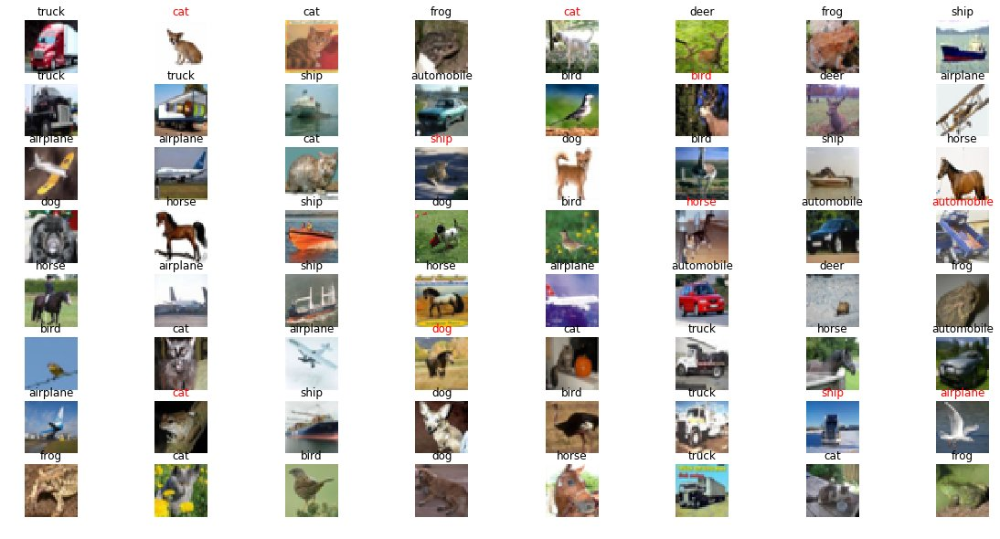

Epoch: 64 acc: 85.799998045 score: 0.0670123135629
airplane: 86.7, automobile: 93.8, bird: 77.2, cat: 69.1, deer: 80.6, dog: 81.2, frog: 92.2, horse: 92.3, ship: 91.9, truck: 93.0


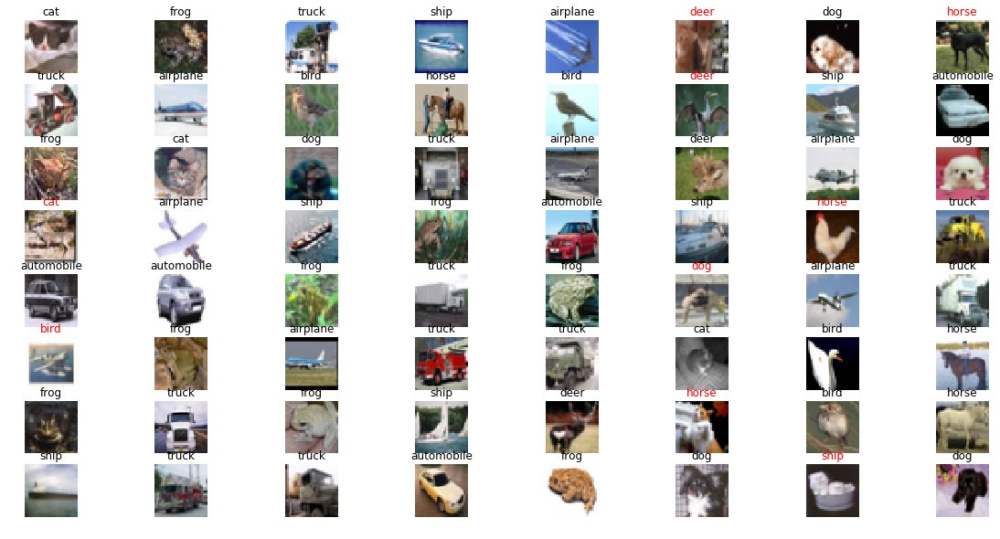

Epoch: 65 acc: 86.0800027847 score: 0.0669509485623
airplane: 84.0, automobile: 92.1, bird: 78.1, cat: 65.8, deer: 90.8, dog: 81.9, frog: 89.7, horse: 89.5, ship: 94.0, truck: 94.9


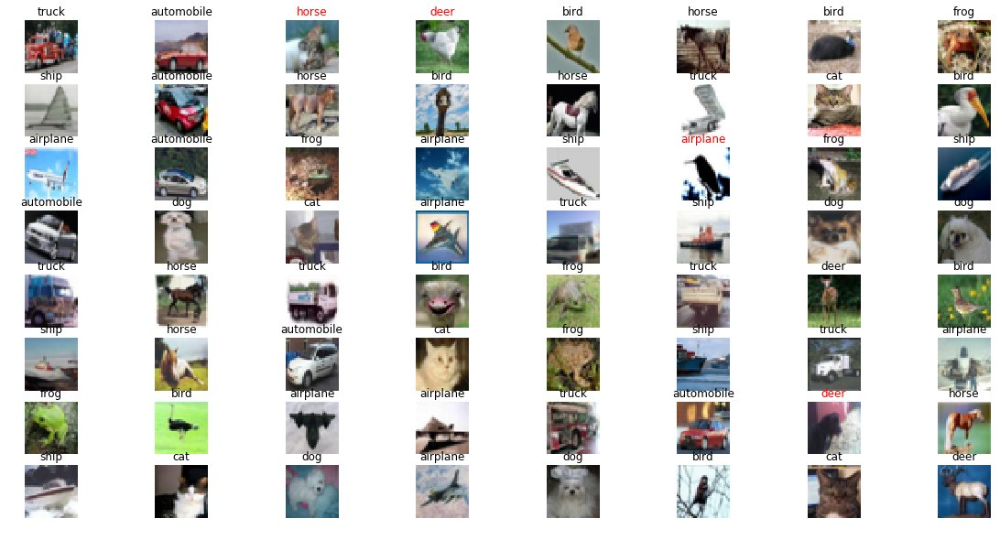

Epoch: 66 acc: 85.8699977398 score: 0.0667029434133
airplane: 93.0, automobile: 94.5, bird: 80.5, cat: 79.6, deer: 79.7, dog: 77.8, frog: 89.6, horse: 85.6, ship: 92.1, truck: 86.3


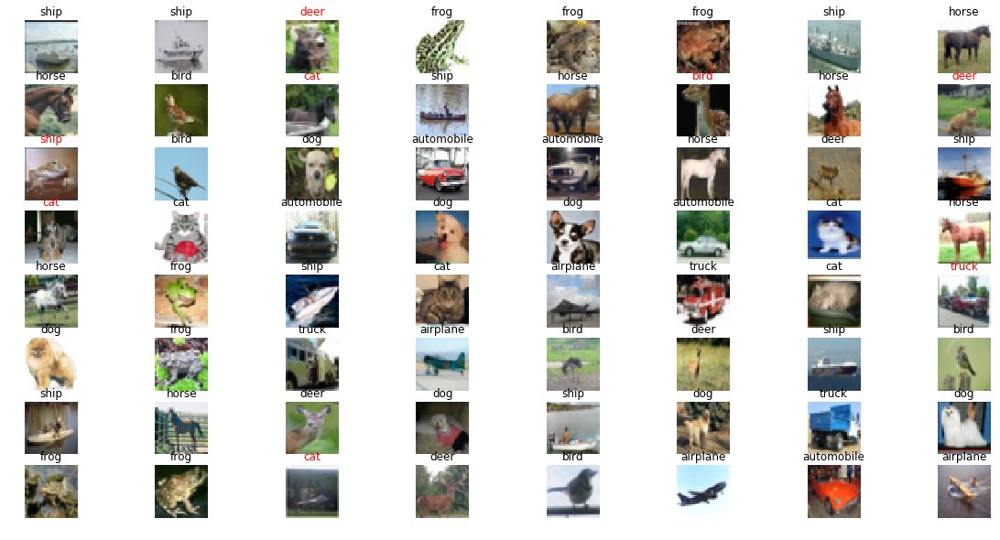

Epoch: 67 acc: 86.6199970245 score: 0.0682606937779
airplane: 83.1, automobile: 94.5, bird: 87.9, cat: 74.5, deer: 82.9, dog: 80.5, frog: 89.3, horse: 86.3, ship: 93.1, truck: 94.1


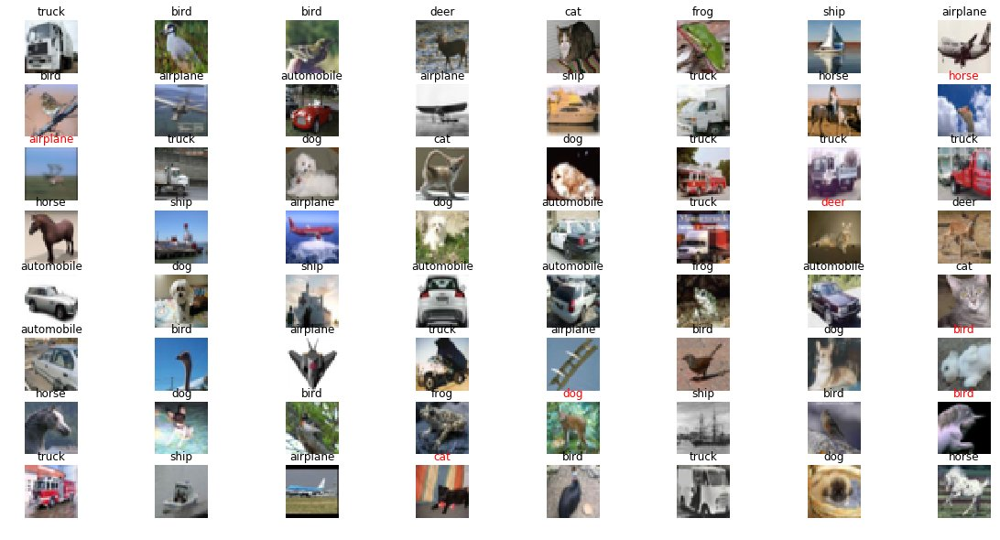

Epoch: 68 acc: 86.3799989223 score: 0.066033790368
airplane: 90.8, automobile: 96.2, bird: 78.5, cat: 70.4, deer: 83.3, dog: 82.5, frog: 90.8, horse: 90.7, ship: 89.9, truck: 90.7


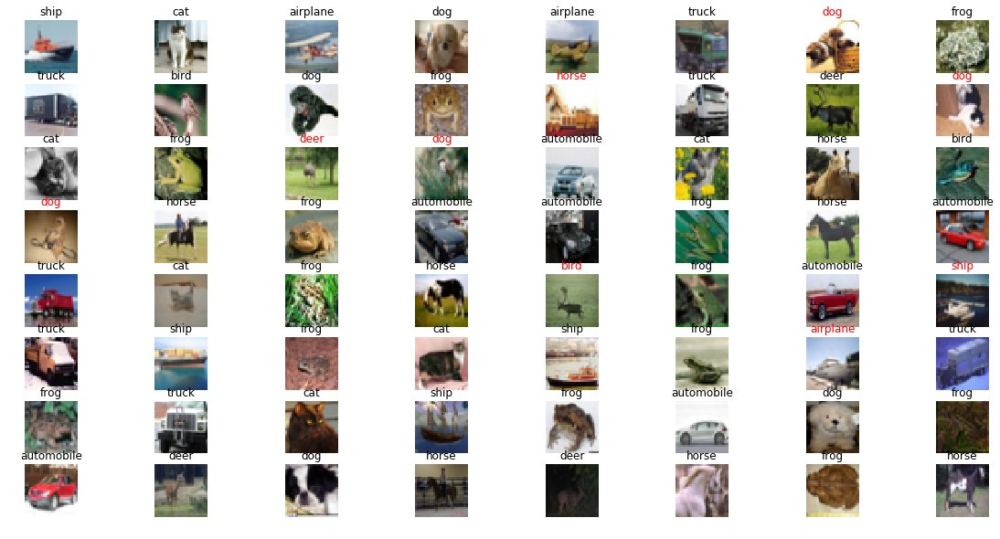

Epoch: 69 acc: 86.360001564 score: 0.064002097331
airplane: 85.0, automobile: 96.2, bird: 86.7, cat: 76.7, deer: 87.4, dog: 81.1, frog: 85.8, horse: 83.1, ship: 92.3, truck: 89.3


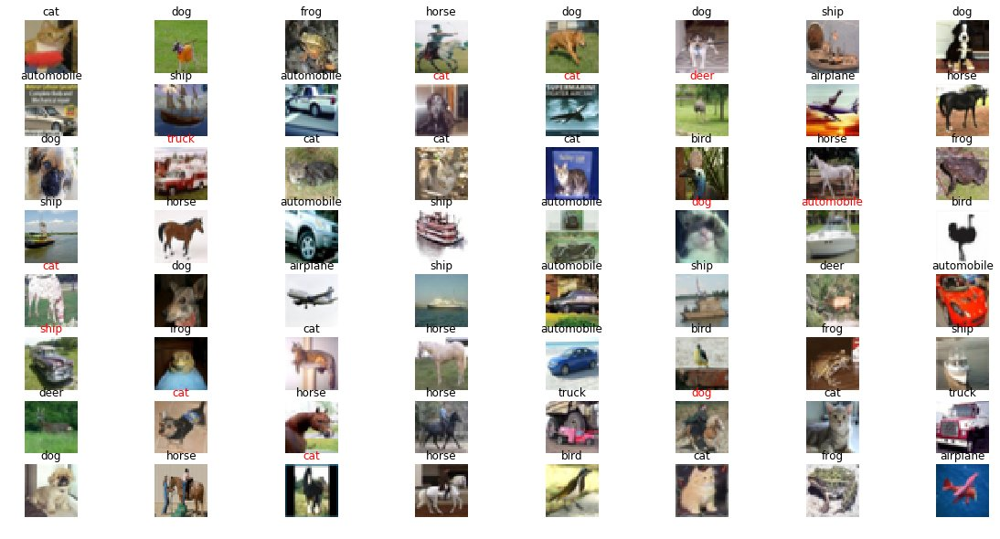

Epoch: 70 acc: 85.9700024128 score: 0.0630904015264
airplane: 91.1, automobile: 94.8, bird: 79.2, cat: 66.1, deer: 87.2, dog: 80.2, frog: 91.1, horse: 92.2, ship: 88.6, truck: 89.2


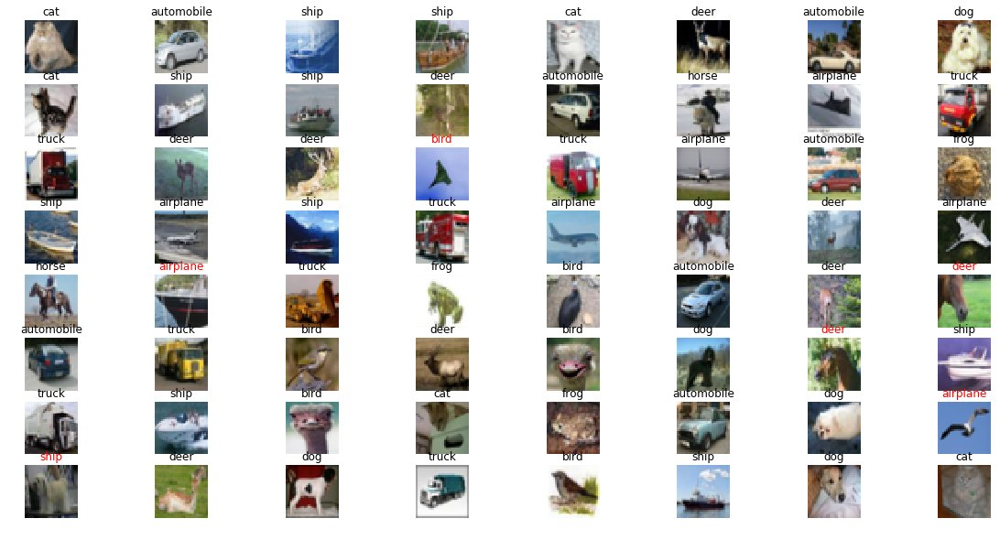

Epoch: 71 acc: 86.470001936 score: 0.0671550553246
airplane: 91.0, automobile: 92.5, bird: 81.7, cat: 73.0, deer: 84.8, dog: 78.7, frog: 89.9, horse: 88.1, ship: 92.4, truck: 92.6


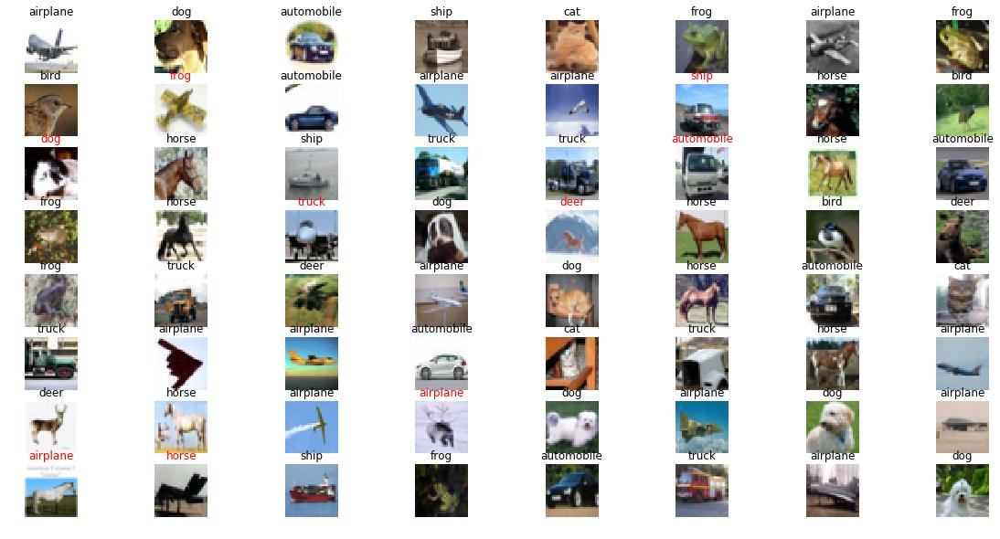

Epoch: 72 acc: 86.4499986172 score: 0.0635280631109
airplane: 88.3, automobile: 94.2, bird: 83.2, cat: 71.6, deer: 80.7, dog: 83.2, frog: 87.5, horse: 89.4, ship: 91.5, truck: 94.9


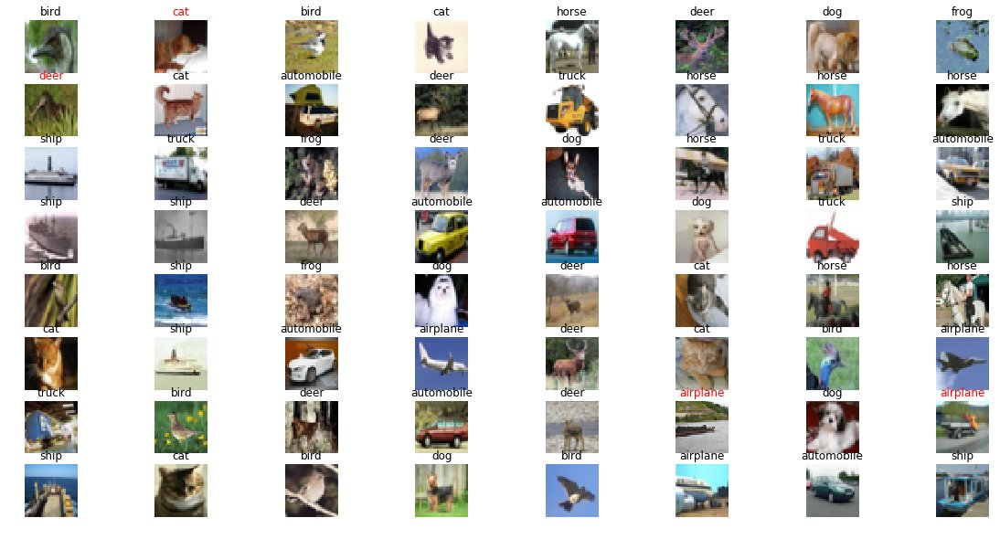

Epoch: 73 acc: 86.2800002098 score: 0.0634363410206
airplane: 86.3, automobile: 93.4, bird: 79.6, cat: 65.2, deer: 89.3, dog: 83.9, frog: 89.2, horse: 89.4, ship: 93.9, truck: 92.6


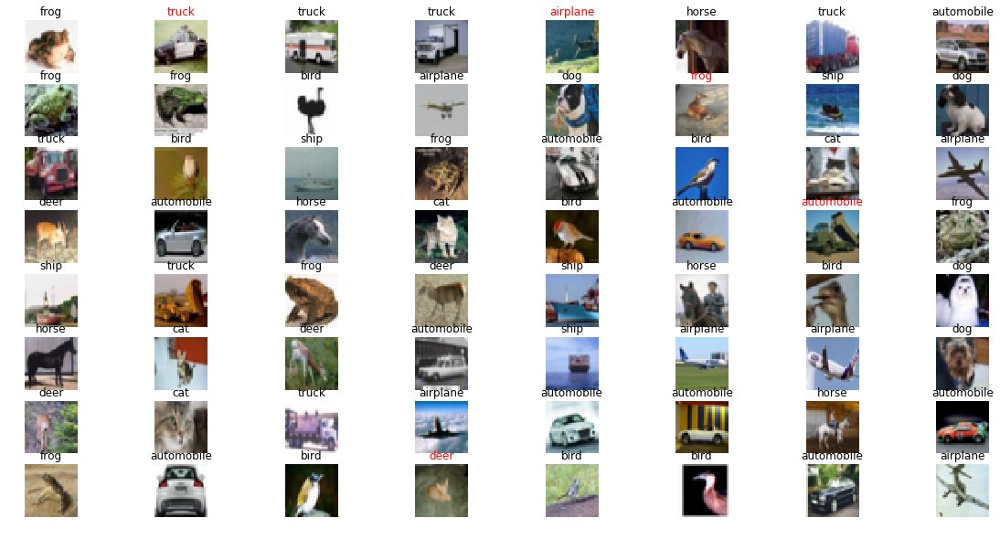

Epoch: 74 acc: 86.5400016308 score: 0.0636126942407
airplane: 90.4, automobile: 94.1, bird: 83.2, cat: 73.9, deer: 86.5, dog: 78.1, frog: 89.2, horse: 86.9, ship: 91.7, truck: 91.4


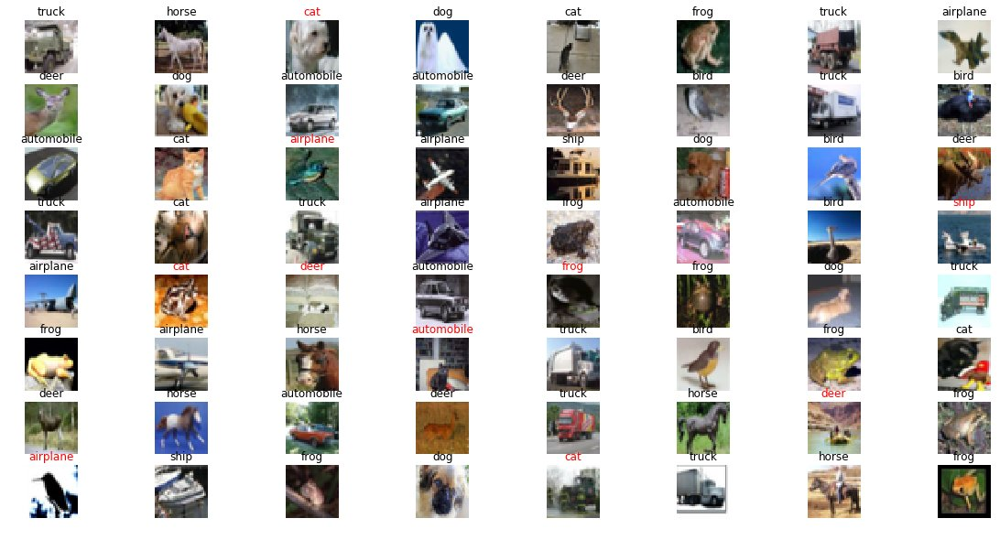

Epoch: 75 acc: 86.369997263 score: 0.0623187608826
airplane: 87.6, automobile: 93.4, bird: 84.4, cat: 65.3, deer: 88.7, dog: 78.6, frog: 86.8, horse: 91.6, ship: 94.4, truck: 92.9


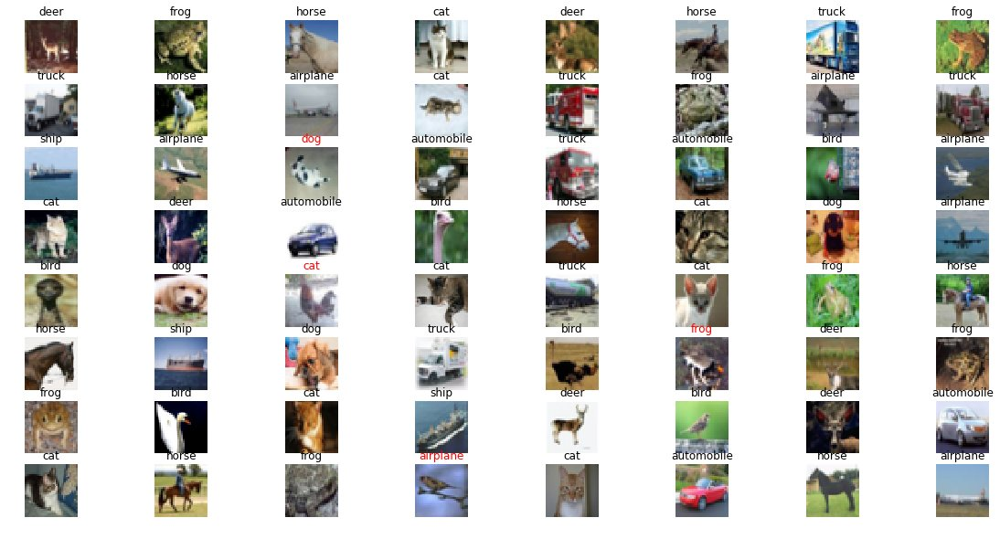

Epoch: 76 acc: 86.5299999714 score: 0.0627764338106
airplane: 91.4, automobile: 95.0, bird: 77.7, cat: 70.3, deer: 91.4, dog: 78.2, frog: 90.9, horse: 91.1, ship: 89.1, truck: 90.2


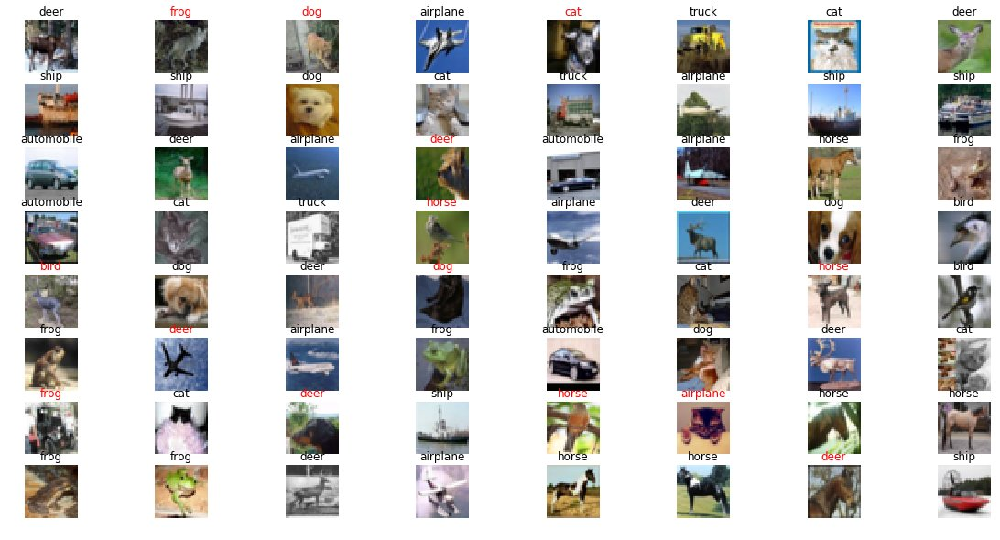

Epoch: 77 acc: 86.8200004101 score: 0.0623781100936
airplane: 87.5, automobile: 94.4, bird: 83.8, cat: 72.0, deer: 85.3, dog: 82.4, frog: 88.0, horse: 89.9, ship: 92.2, truck: 92.7


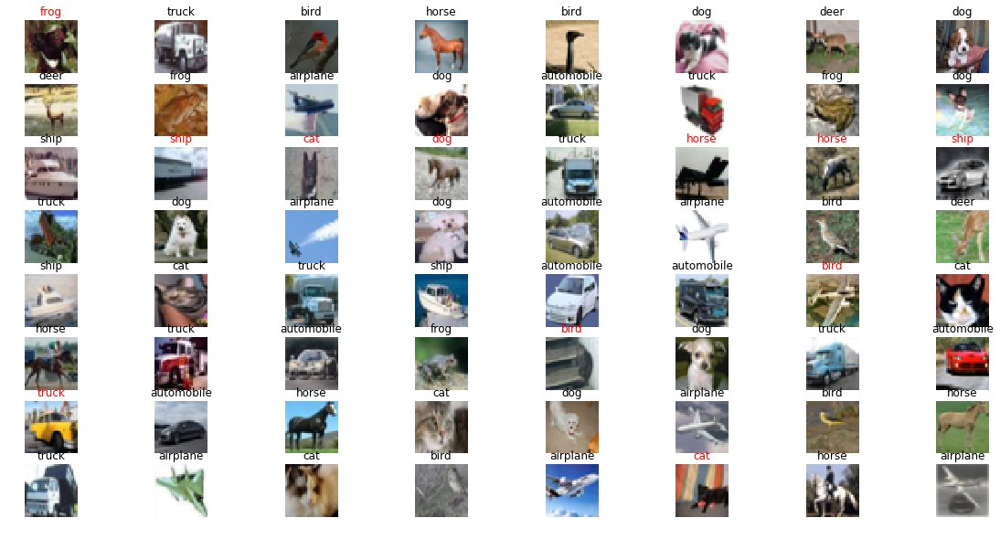

Saving


Epoch: 78 acc: 86.6900026798 score: 0.0618804483227
airplane: 85.9, automobile: 94.3, bird: 78.7, cat: 72.9, deer: 88.6, dog: 81.8, frog: 88.6, horse: 92.7, ship: 92.7, truck: 90.7


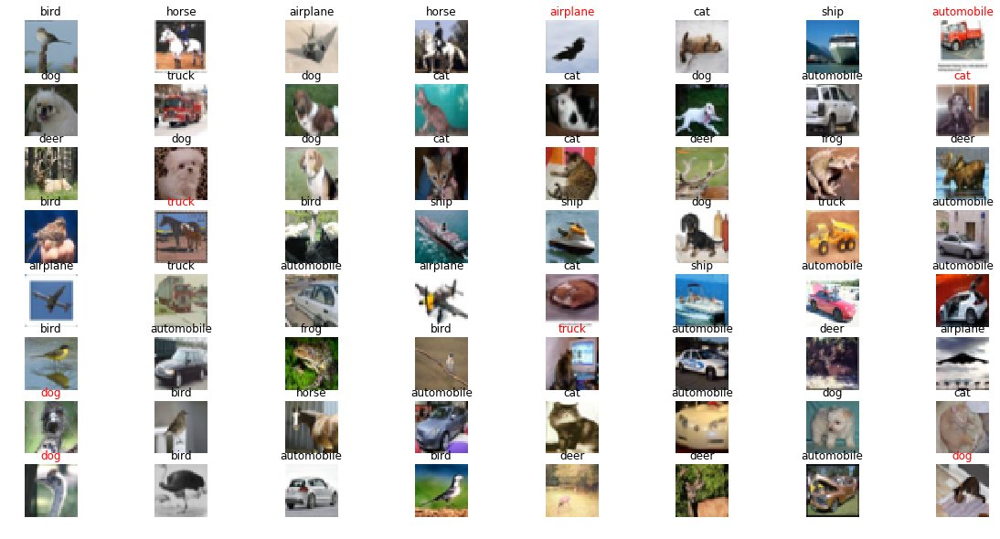

Epoch: 79 acc: 86.779999733 score: 0.0639301470189
airplane: 89.3, automobile: 93.4, bird: 78.7, cat: 77.9, deer: 89.2, dog: 76.8, frog: 89.2, horse: 90.4, ship: 89.7, truck: 93.2


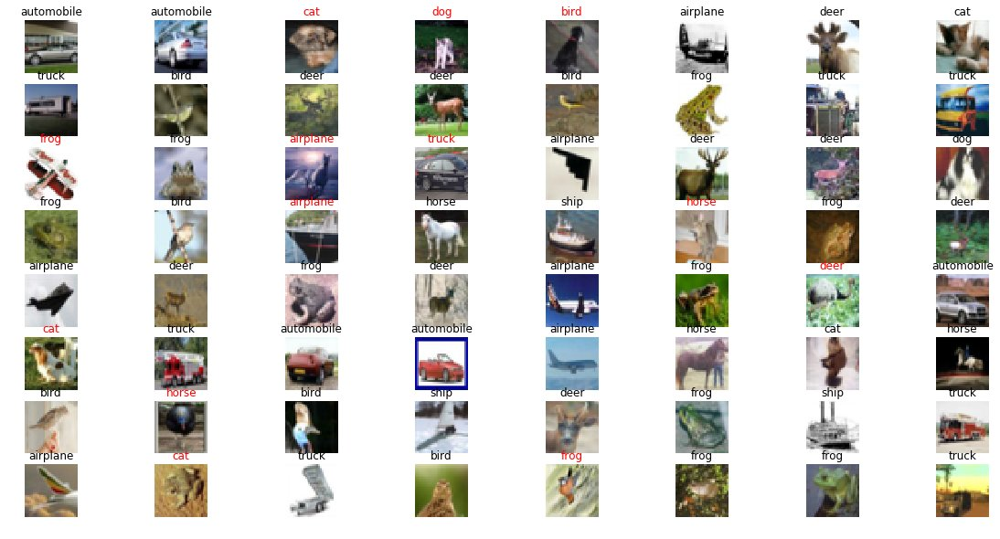

Epoch: 80 acc: 86.5100026131 score: 0.0596456384679
airplane: 92.9, automobile: 93.9, bird: 80.7, cat: 74.4, deer: 86.4, dog: 76.1, frog: 87.8, horse: 89.5, ship: 93.8, truck: 89.6


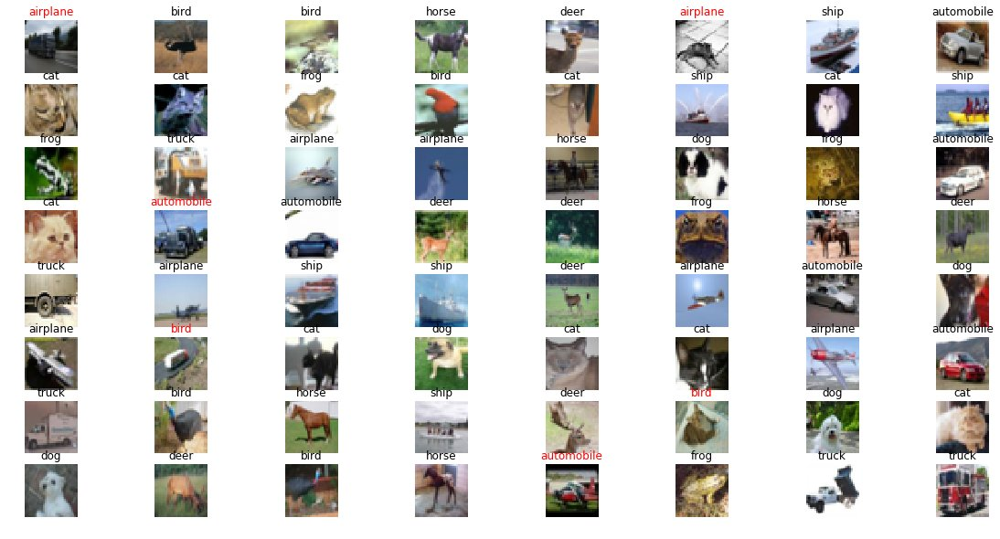

Epoch: 81 acc: 86.5599989891 score: 0.058876296951
airplane: 83.9, automobile: 96.0, bird: 82.2, cat: 73.2, deer: 85.6, dog: 84.1, frog: 90.3, horse: 87.2, ship: 92.8, truck: 90.3


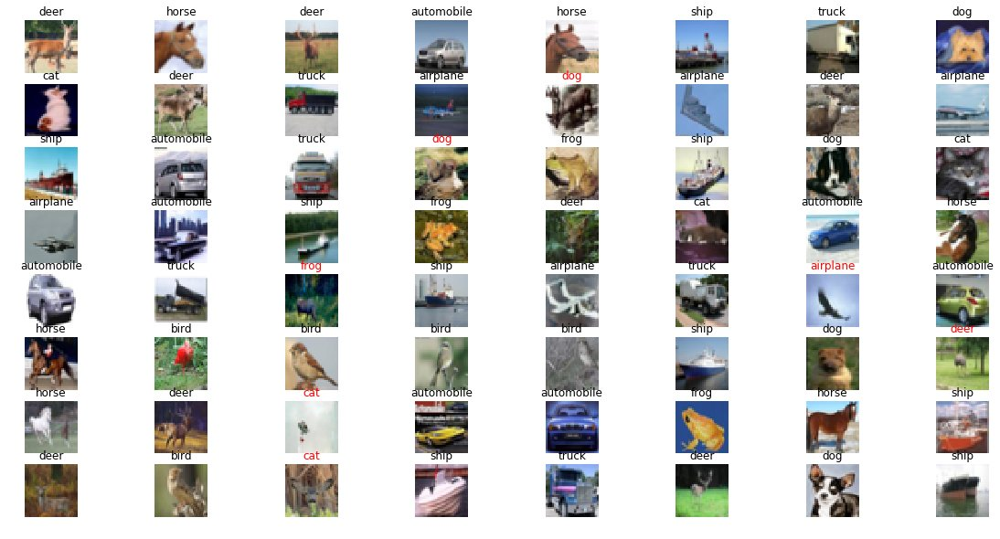

Epoch: 82 acc: 86.5899980068 score: 0.0606896386868
airplane: 83.6, automobile: 94.0, bird: 84.9, cat: 71.2, deer: 88.6, dog: 80.4, frog: 91.3, horse: 88.2, ship: 93.9, truck: 89.8


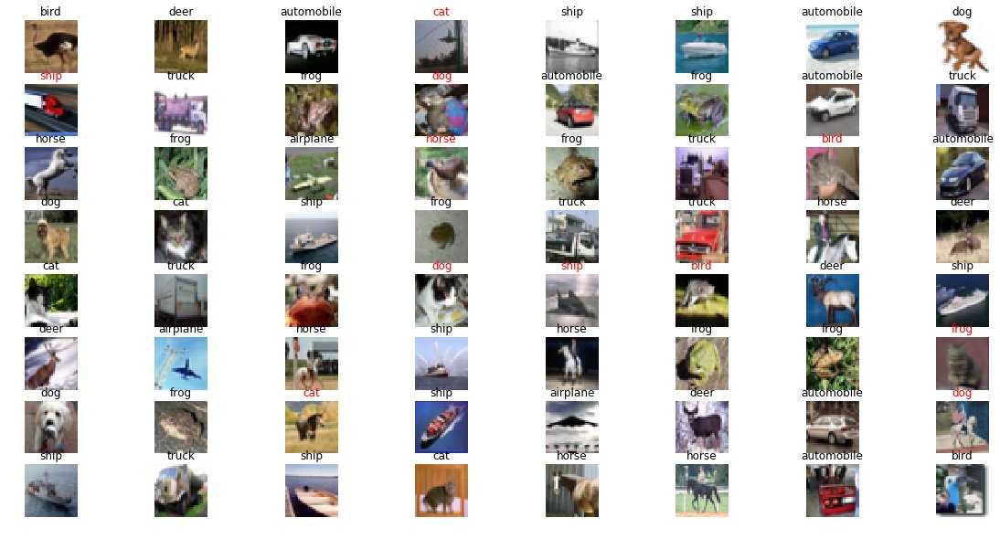

Epoch: 83 acc: 86.2699985504 score: 0.0594333134218
airplane: 83.0, automobile: 93.5, bird: 83.0, cat: 80.3, deer: 84.3, dog: 77.0, frog: 87.0, horse: 88.0, ship: 90.9, truck: 95.7


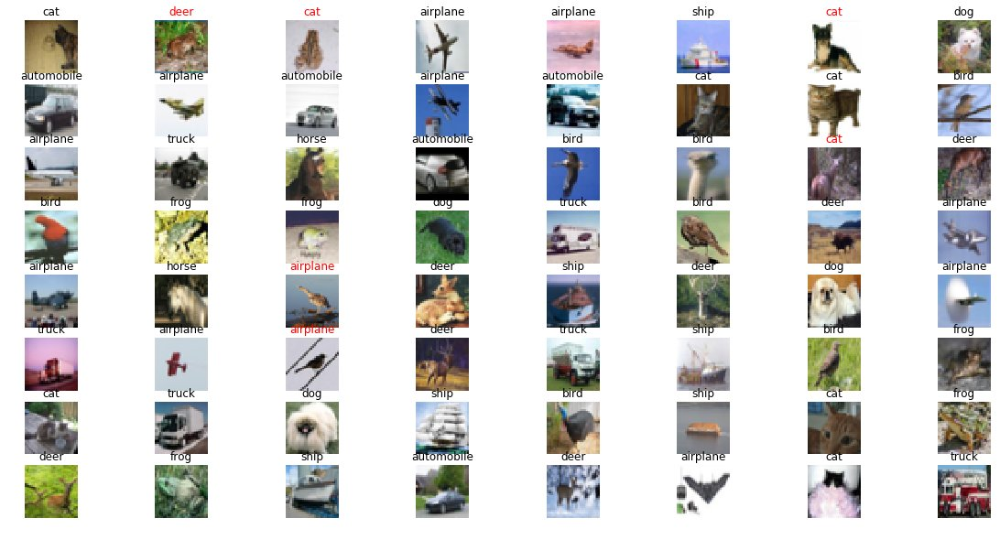

Epoch: 84 acc: 86.6199970245 score: 0.0591132166074
airplane: 88.5, automobile: 96.0, bird: 82.2, cat: 75.9, deer: 78.2, dog: 81.6, frog: 91.5, horse: 91.1, ship: 90.2, truck: 91.0


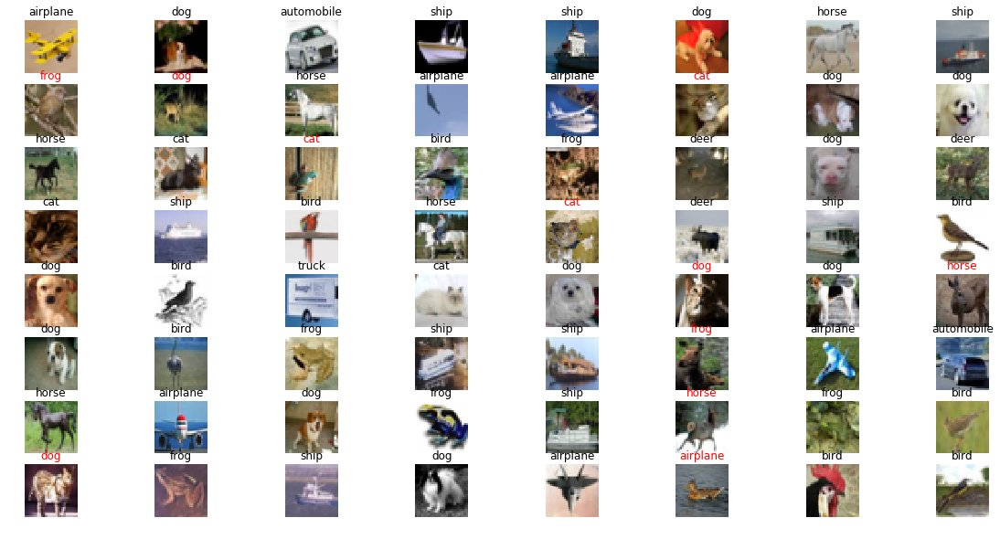

Epoch: 85 acc: 86.5499973297 score: 0.0586917799115
airplane: 87.9, automobile: 91.4, bird: 76.3, cat: 70.2, deer: 86.3, dog: 83.2, frog: 91.0, horse: 92.4, ship: 91.1, truck: 95.7


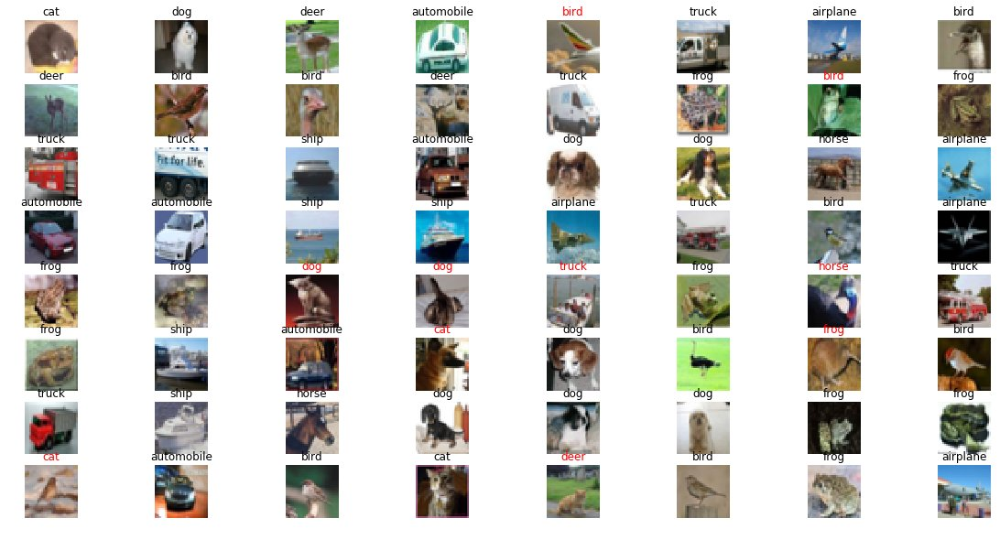

Epoch: 86 acc: 87.1699988842 score: 0.0584297531564
airplane: 88.1, automobile: 93.1, bird: 88.1, cat: 70.9, deer: 88.4, dog: 80.4, frog: 88.1, horse: 87.9, ship: 93.6, truck: 93.1


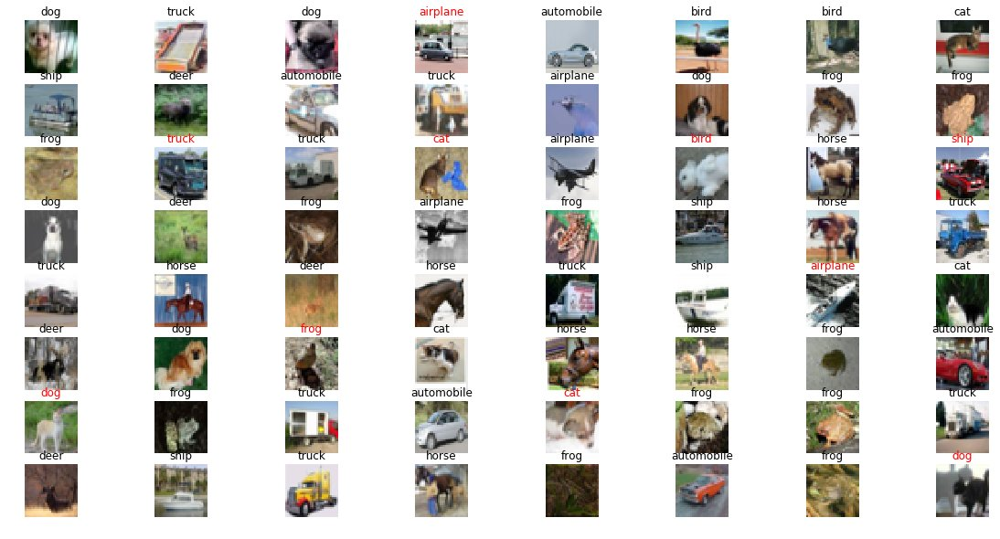

Saving


Epoch: 87 acc: 86.6900026798 score: 0.0570086448097
airplane: 93.0, automobile: 95.0, bird: 77.9, cat: 66.9, deer: 90.5, dog: 81.5, frog: 89.1, horse: 91.3, ship: 91.4, truck: 90.3


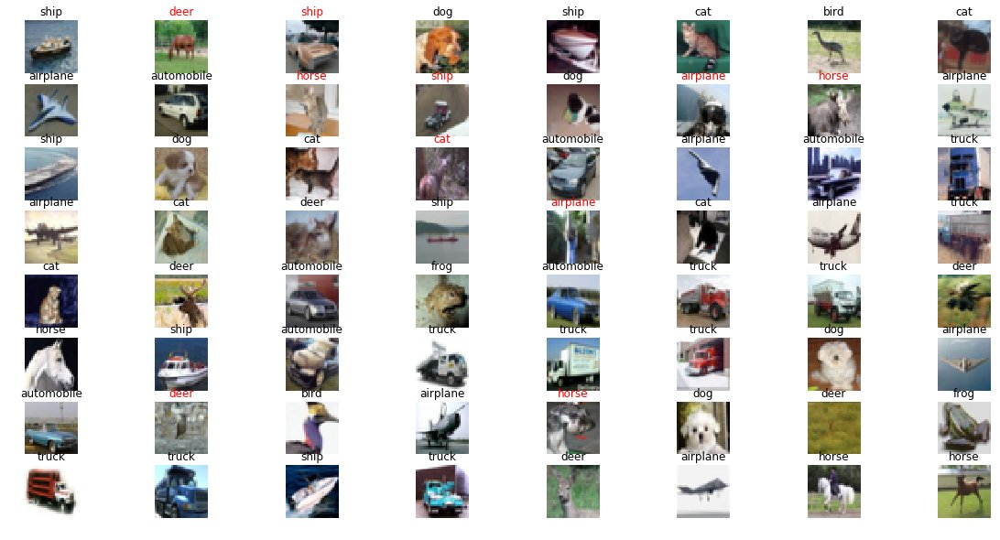

Epoch: 88 acc: 87.0000004768 score: 0.0592945805657
airplane: 91.8, automobile: 93.5, bird: 81.5, cat: 72.3, deer: 85.1, dog: 81.9, frog: 91.8, horse: 89.1, ship: 90.7, truck: 92.3


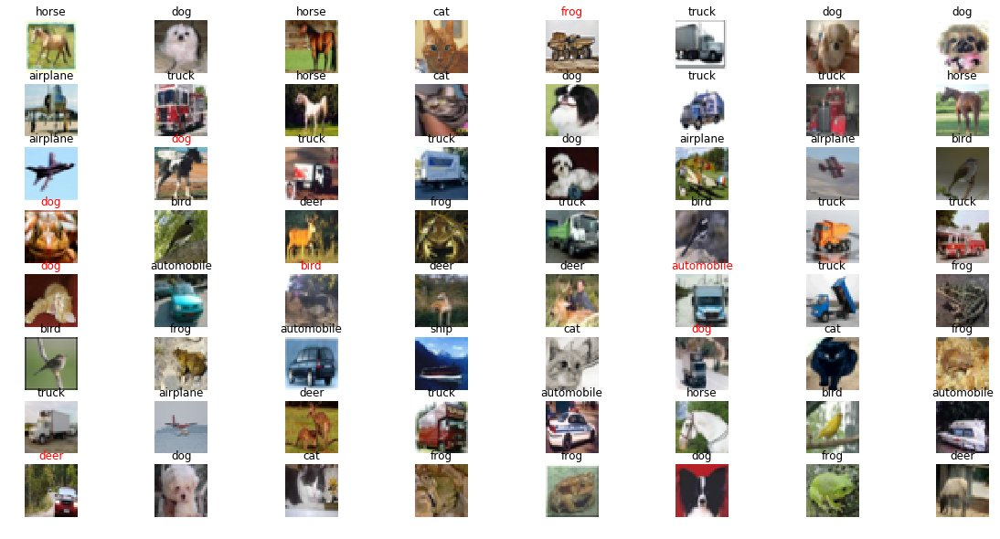

Epoch: 89 acc: 87.1599972248 score: 0.0561340197422
airplane: 91.7, automobile: 93.9, bird: 81.7, cat: 70.5, deer: 87.8, dog: 77.5, frog: 92.1, horse: 91.0, ship: 92.3, truck: 93.1


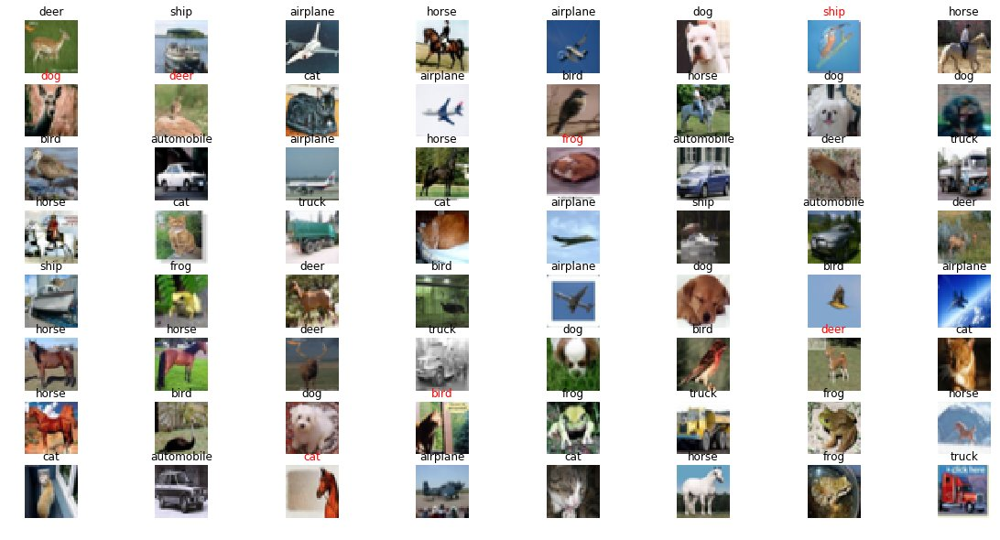

Epoch: 90 acc: 86.4400029182 score: 0.0558829045148
airplane: 88.8, automobile: 90.8, bird: 81.3, cat: 68.2, deer: 83.2, dog: 83.5, frog: 90.3, horse: 90.6, ship: 90.9, truck: 96.8


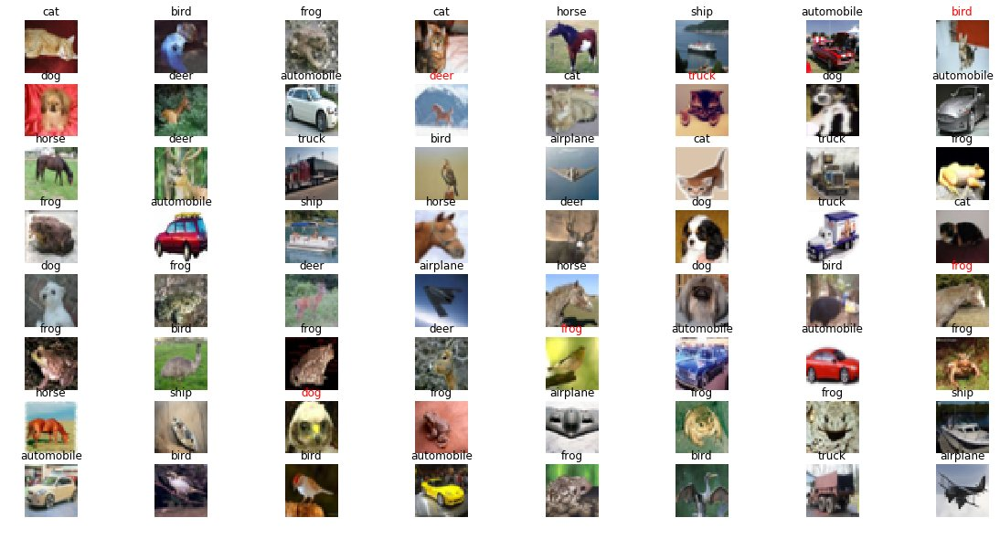

Epoch: 91 acc: 86.8900001049 score: 0.0560153733752
airplane: 91.0, automobile: 94.9, bird: 82.5, cat: 67.3, deer: 86.4, dog: 83.9, frog: 88.8, horse: 93.3, ship: 91.7, truck: 89.1


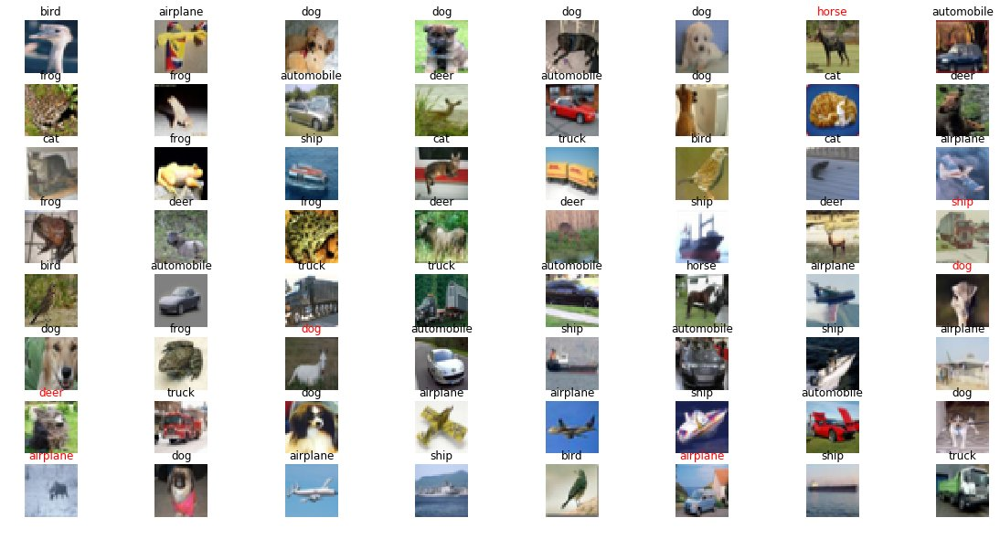

Epoch: 92 acc: 86.5599989891 score: 0.0553664019567
airplane: 88.1, automobile: 96.2, bird: 79.6, cat: 65.6, deer: 88.4, dog: 85.8, frog: 92.3, horse: 91.2, ship: 89.8, truck: 88.6


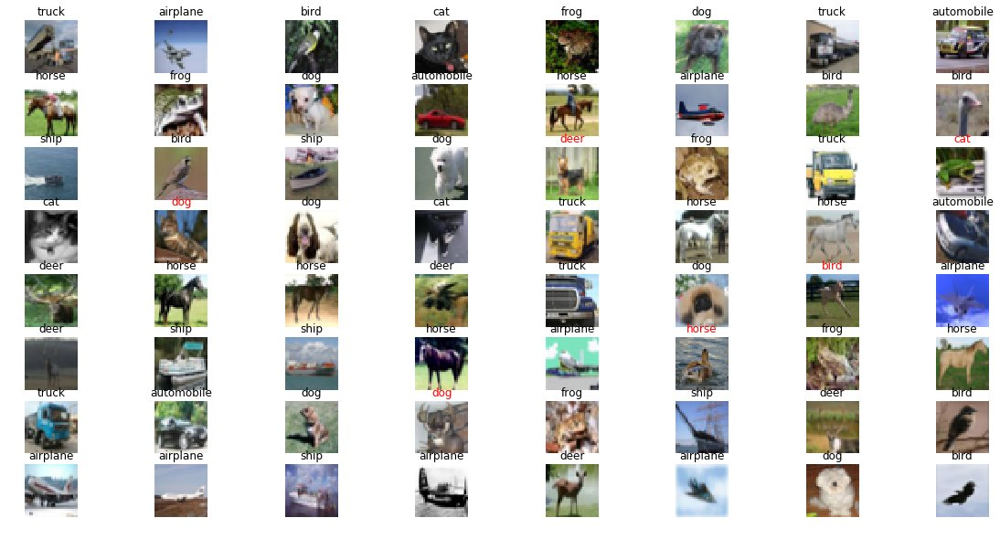

Epoch: 93 acc: 86.669999361 score: 0.0567269649296
airplane: 84.9, automobile: 96.0, bird: 86.2, cat: 72.3, deer: 84.1, dog: 78.6, frog: 92.1, horse: 86.9, ship: 91.7, truck: 93.9


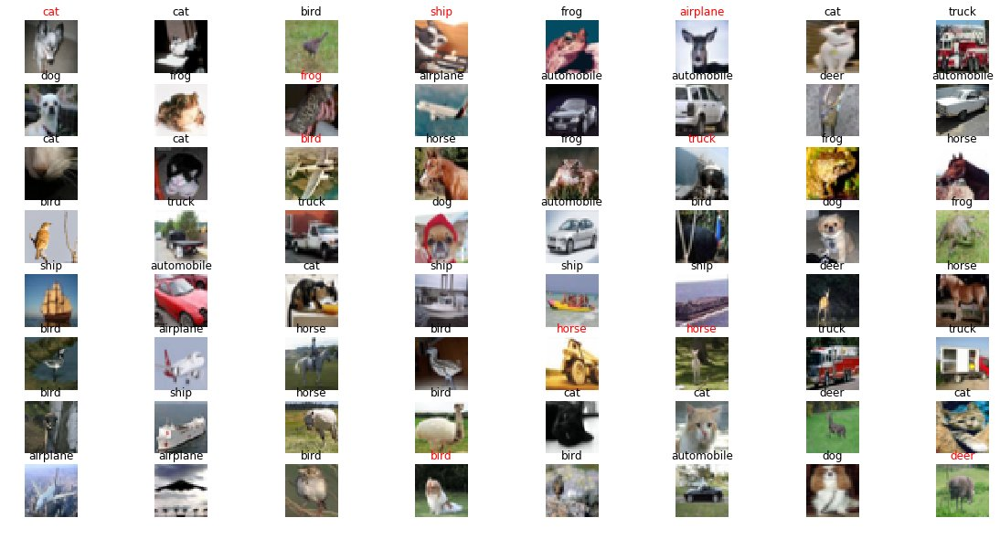

Epoch: 94 acc: 86.1299991608 score: 0.0564846117545
airplane: 87.9, automobile: 92.1, bird: 81.4, cat: 62.8, deer: 86.4, dog: 79.0, frog: 96.3, horse: 90.1, ship: 90.4, truck: 94.9


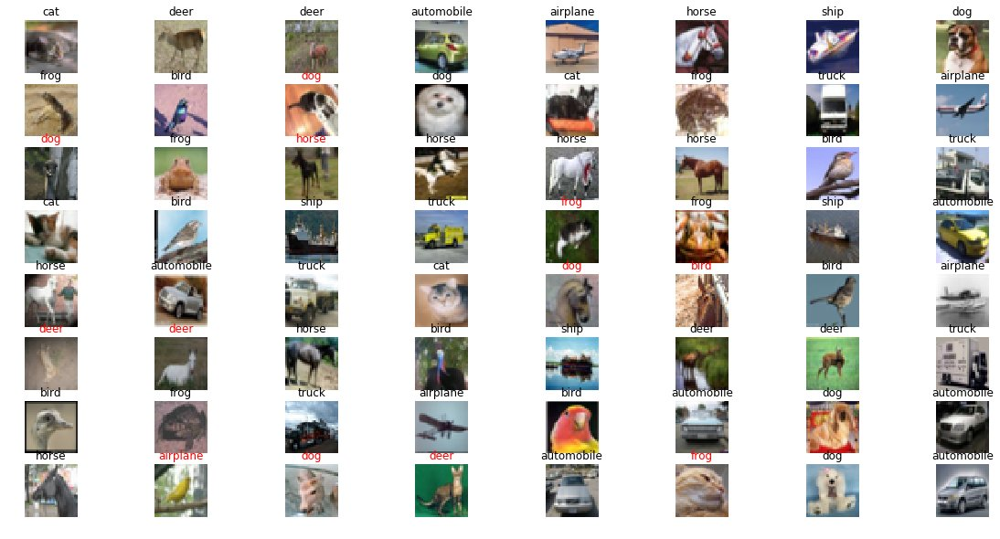

Epoch: 95 acc: 86.4899992943 score: 0.0540170807483
airplane: 83.6, automobile: 94.7, bird: 79.3, cat: 68.0, deer: 85.2, dog: 85.1, frog: 93.2, horse: 88.0, ship: 94.4, truck: 93.4


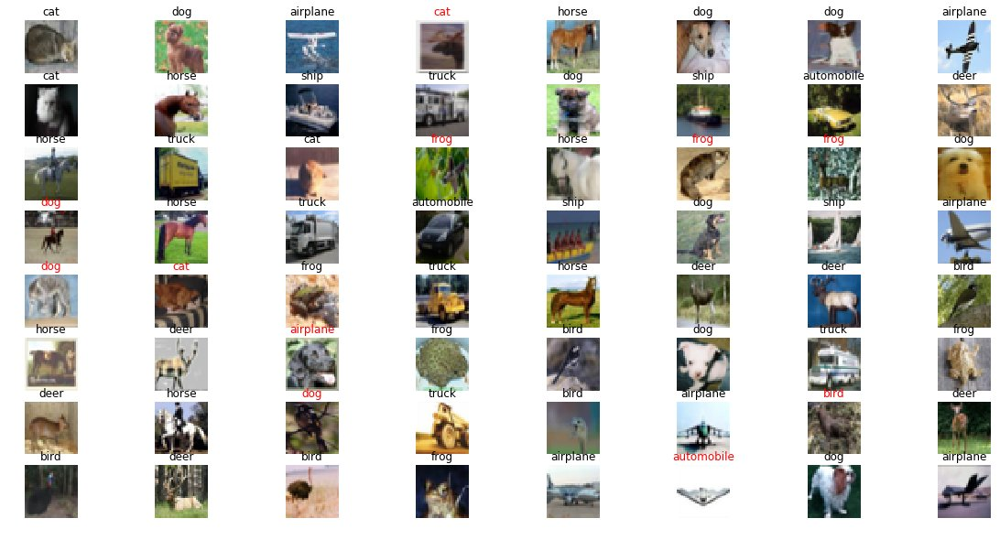

Epoch: 96 acc: 86.7900013924 score: 0.0536258183229
airplane: 92.0, automobile: 95.2, bird: 87.0, cat: 79.4, deer: 82.3, dog: 74.2, frog: 89.3, horse: 88.1, ship: 89.6, truck: 90.8


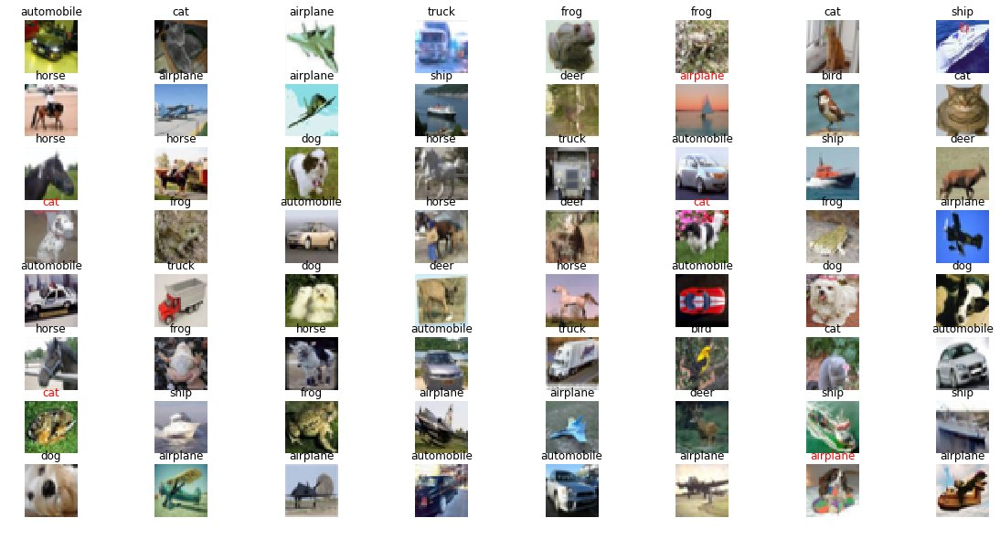

Epoch: 97 acc: 87.1500015259 score: 0.0528787722324
airplane: 90.9, automobile: 92.8, bird: 80.7, cat: 74.3, deer: 87.7, dog: 79.9, frog: 88.6, horse: 91.0, ship: 89.7, truck: 95.9


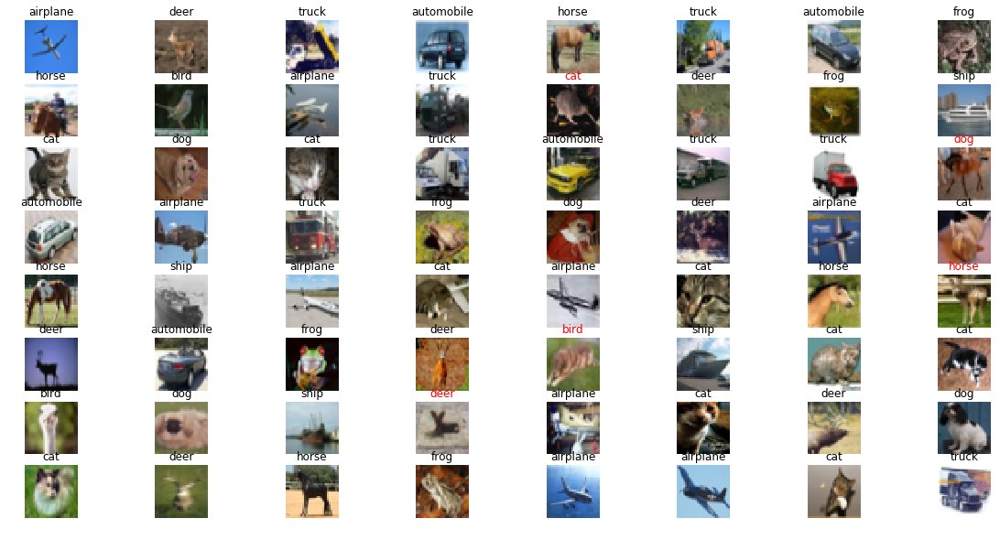

Epoch: 98 acc: 86.4300012589 score: 0.0558245656726
airplane: 87.8, automobile: 96.1, bird: 85.5, cat: 79.1, deer: 84.6, dog: 74.7, frog: 91.2, horse: 86.1, ship: 94.8, truck: 84.4


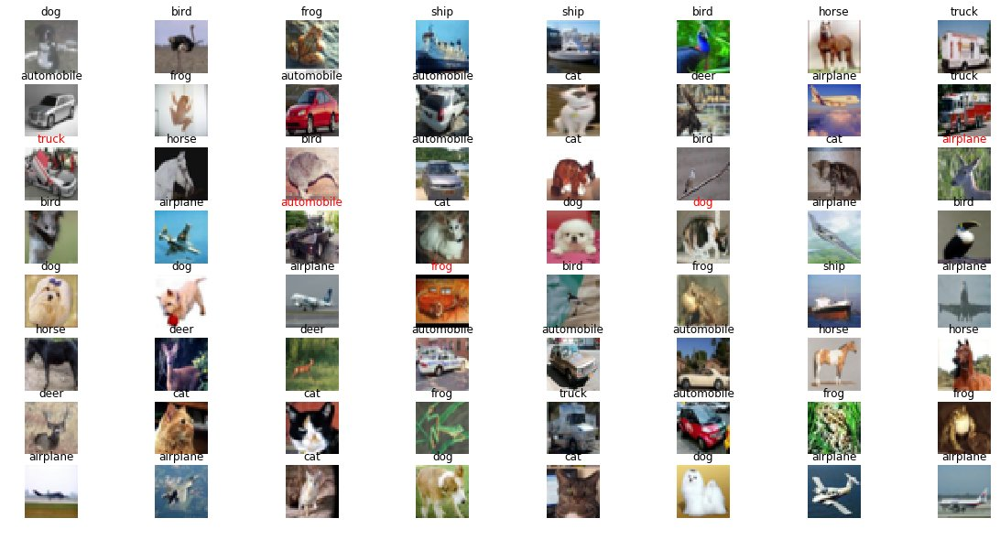

Epoch: 99 acc: 87.239998579 score: 0.054744398469
airplane: 88.0, automobile: 95.3, bird: 81.1, cat: 75.8, deer: 84.1, dog: 81.7, frog: 91.7, horse: 90.1, ship: 92.9, truck: 91.7


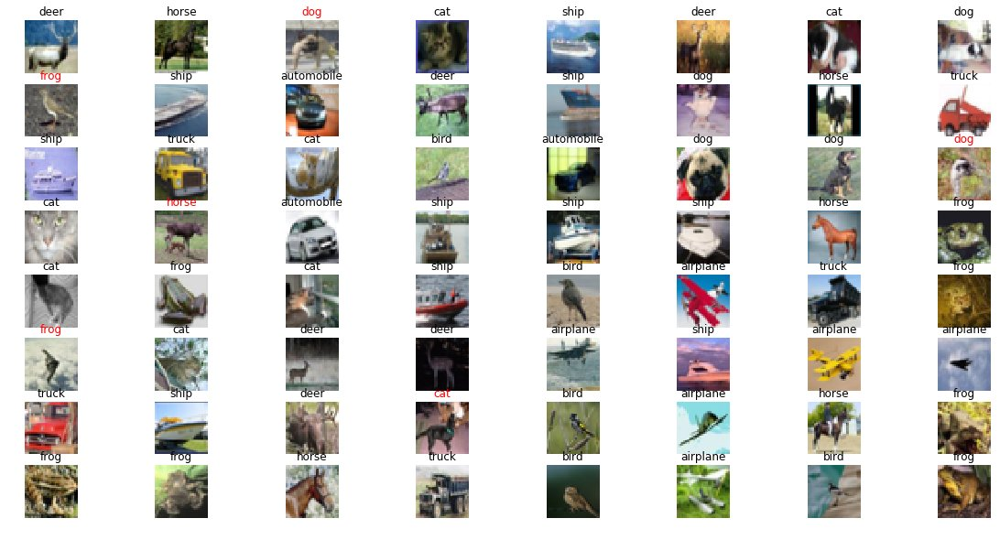

Saving


NameError: name 'writer' is not defined

In [7]:
### Train model
print(dataset_test)
print(y_train.shape)

sess = tf.Session()

# writer = tf.train.SummaryWriter(logs_path, graph=tf.get_default_graph())
#tf.summary.scalar('acc', accuracy)
#merged = tf.summary.merge_all()

sess.run(init)

# writer = tf.summary.FileWriter('./logs/train', sess.graph)

saver = tf.train.Saver()

best = 0.0
for epoch in range(100):
    scores = []
    for step in tqdm(range(0, 5 * y_train.shape[0], BATCH_SIZE)):
        _, _, score = sess.run([trainer, update_ops, cross_entropy])
        scores.append(score)

    acc, pred, imgs, labs = sess.run([accuracy, prediction, test_inputs, test_labels])
    #writer.add_summary(summary, epoch)
    
    # total accuracy
    print('Epoch:', epoch, 'acc:', 100.0 * acc, 'score:', sum(scores) / len(scores))
    
    # Calculate accuracy per class
    total, correct = [0] * 10, [0] * 10
    for i in range(len(labs)):
        total[labs[i]] += 1
        if pred[i] == labs[i]:
            correct[labs[i]] += 1
    accs = [1.0*correct[i] / total[i] for i in range(10)]
    print(', '.join([LABELS[i] + ': ' + str(round(100.0*accs[i], 2)) for i in range(10)]))
    
    # display sample classification results
    display_images(imgs[:BATCH_SIZE], pred[:BATCH_SIZE], labs[:BATCH_SIZE], 8, 8)
    
    if acc > best:
        print('Saving')
        save_path = saver.save(sess, "./%f-%d.ckpt" % (acc, epoch))
        best = acc
#writer.close()